## Integrate cohorts: Hugo, Riaz, Liu ,Gide, Newell, Du and Checkmate

In [1]:
import numpy as np
import seaborn as sns

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.legend import Legend
import matplotlib.colors as colors
from matplotlib import cm
from mpl_toolkits.mplot3d import axes3d

import pandas as pd
import scipy

from sklearn import datasets
from sklearn.decomposition import PCA
from sklearn.decomposition import TruncatedSVD
from sklearn.model_selection import train_test_split
from sklearn.metrics import RocCurveDisplay
from sklearn.preprocessing import LabelBinarizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import StandardScaler

from umap import UMAP

# Import rpy2 for R objects
import rpy2.robjects as robjects

from numba import jit

sns.set()

epsilon =  10.**(-32.)

In [2]:
from platform import python_version
print(python_version())

3.10.12


In [3]:
def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap


cmap = plt.get_cmap('Set2')
new_cmap = truncate_colormap(cmap, 0., 1.,n=9)


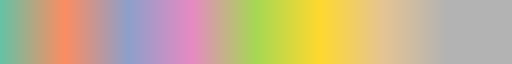

In [4]:
new_cmap

## Inspect individual datasets 

In [5]:
cohorts = np.array(['Hugo', 'Riaz', 'Liu', 'Gide', 'Newell', 'Cm38', 'Cm64', 'Cm67'])

### Import clinical data

### Hugo

In [38]:
hugo = pd.read_csv('./../Data/Preprocessing_TPM_data/TPM_HUGO.csv', sep='\t',low_memory=False, index_col=0)
hugo_pt = hugo.keys().values
print(hugo.shape)
print(hugo_pt)

(35587, 28)
['Pt1' 'Pt2' 'Pt4' 'Pt5' 'Pt6' 'Pt7' 'Pt8' 'Pt9' 'Pt10' 'Pt12' 'Pt13'
 'Pt14' 'Pt15' 'Pt16' 'Pt19' 'Pt20' 'Pt22' 'Pt23' 'Pt25' 'Pt27A' 'Pt27B'
 'Pt28' 'Pt29' 'Pt31' 'Pt32' 'Pt35' 'Pt37' 'Pt38']


In [39]:
### Pt27A and Pt 27B are two samples from the same patient
hugo_pt = np.array(['Pt1', 'Pt2', 'Pt4', 'Pt5', 'Pt6', 'Pt7', 'Pt8', 'Pt9', 'Pt10', 'Pt12', 'Pt13',
 'Pt14', 'Pt15', 'Pt16', 'Pt19', 'Pt20', 'Pt22', 'Pt23', 'Pt25', 'Pt27A',
 'Pt28', 'Pt29', 'Pt31', 'Pt32', 'Pt35', 'Pt37', 'Pt38'])


In [40]:
hugo = hugo.drop(columns=['Pt27B'])

In [41]:
#From 'Clinical data master spreadsheet':
Hugo_clin_pt = np.array(['Pt14','Pt23','Pt32','Pt22','Pt16','Pt25','Pt29','Pt12','Pt20','Pt37','Pt10',
                         'Pt35','Pt5','Pt28','Pt38','Pt27A','Pt1','Pt7','Pt31','Pt6','Pt13','Pt2','Pt4','Pt15',
                         'Pt9','Pt19','Pt8'])

Hugo_clin_iR = np.array(['PD','PD','PD','PD','PD','PD','PD','PD','PD','PR','PD','PR','PR','PR','PR','CR','PD','PD','PD','PR','CR','PR','PR','PR','CR','PR','CR'])
    
Hugo_clin_days = np.array([54, 103, 171, 182, 186, 262, 269, 327, 337, 364, 387, 427, 439, 439, 448, 548, 607, 
                           662, 704, 882, 917, 927, 948, 980, 1054, 1060, np.nan])

    
Hugo_clin_dead = np.array([0,1,1,1,1,1,1,1,1,0,0,0,0,1,0,0,1,1,0,0,0,0,0,1,0,0,0])

In [42]:
print('Clinical data:',len(Hugo_clin_pt))
print('Sequence data:',len(hugo_pt))

Clinical data: 27
Sequence data: 27


In [43]:
#iRECIST, days, dead status in the same order as in xpr dataframe
hugo_ir = np.zeros(len(hugo_pt), dtype=object)
hugo_days = np.zeros(len(hugo_pt), dtype=float)
hugo_dead = np.zeros(len(hugo_pt), dtype=int)

for ind in np.arange(len(hugo_pt)):
    
    ptInd = np.where(Hugo_clin_pt == hugo_pt[ind])[0][0]
    hugo_ir[ind] = Hugo_clin_iR[ptInd]
    hugo_days[ind] = Hugo_clin_days[ptInd]
    hugo_dead[ind] = Hugo_clin_dead[ptInd]

### Riaz

In [44]:
riaz = pd.read_csv('./../Data/Preprocessing_TPM_data/TPM_RIAZ_PRE.csv', sep='\t',low_memory=False)
riaz_pt = np.array(['Pt1','Pt2','Pt23','Pt39','Pt59','Pt82','Pt49','Pt66','Pt76','Pt85','Pt89','Pt101',
                    'Pt47','Pt52','Pt67','Pt94','Pt77','Pt79','Pt84','Pt98','Pt62','Pt65','Pt72','Pt78',
                    'Pt90','Pt92','Pt103','Pt3','Pt4','Pt5','Pt9','Pt10','Pt17','Pt18','Pt38','Pt48',
                    'Pt36','Pt37','Pt46','Pt24','Pt27','Pt29','Pt30','Pt31','Pt8','Pt11','Pt26','Pt28'
                    ,'Pt44','Pt106','Pt34'])
riaz.columns = riaz_pt
print(riaz.shape)
print(riaz.keys().values)

(35587, 51)
['Pt1' 'Pt2' 'Pt23' 'Pt39' 'Pt59' 'Pt82' 'Pt49' 'Pt66' 'Pt76' 'Pt85'
 'Pt89' 'Pt101' 'Pt47' 'Pt52' 'Pt67' 'Pt94' 'Pt77' 'Pt79' 'Pt84' 'Pt98'
 'Pt62' 'Pt65' 'Pt72' 'Pt78' 'Pt90' 'Pt92' 'Pt103' 'Pt3' 'Pt4' 'Pt5' 'Pt9'
 'Pt10' 'Pt17' 'Pt18' 'Pt38' 'Pt48' 'Pt36' 'Pt37' 'Pt46' 'Pt24' 'Pt27'
 'Pt29' 'Pt30' 'Pt31' 'Pt8' 'Pt11' 'Pt26' 'Pt28' 'Pt44' 'Pt106' 'Pt34']


In [45]:
riaz_clin = pd.read_excel('./../Data/Preprocessing_TPM_data/Clinical_characteristics_mmc2.xlsx', header=2)

In [46]:
Riaz_clin_pt = np.array(['Pt36','Pt76','Pt23','Pt17','Pt78','Pt106','Pt9','Pt24','Pt84','Pt1','Pt39','Pt38',
                         'Pt90','Pt79','Pt5','Pt46','Pt10','Pt8','Pt29','Pt2','Pt92','Pt82','Pt77','Pt62',
                         'Pt27','Pt52','Pt103','Pt66','Pt4','Pt37','Pt65','Pt59','Pt47','Pt18','Pt28','Pt98',
                         'Pt72','Pt49','Pt34','Pt101','Pt11','Pt89','Pt85','Pt26','Pt31','Pt94','Pt67','Pt48',
                         'Pt30','Pt44','Pt3'])


Riaz_clin_iR = np.array(['SD','NE','np.nan','PD','PD','PD','PD','PD','PD','PD','PD','SD','PD','SD','PD','PD',
                         'SD','PD','PD','SD','SD','SD','SD','PD','PD','PD','PD','PD','SD','SD','SD','SD','PD',
                         'PR','PD','SD','PR','PR','PR','PR','PD','SD','PD','SD','PD','CR','SD','CR','CR','PR','PR'])
    
Riaz_clin_days = np.array([0, 10, 52, 57, 78, 91, 92, 149, 151, 160, 166, 167, 174, 218, 222, 227, 256, 259, 273, 
                           275, 333, 429, 471, 472, 475, 476, 484, 542, 633, 646, 692, 707, 718, 718, 740, 747,
                           770, 826, 834, 834, 837, 844, 904, 952, 961, 981, 1032, 1046, 1053, 1093, 1144])
    
Riaz_clin_dead = np.array([1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0,1,1,1,1,1,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0])

In [47]:
Riaz_clin_prior_ctl4 = np.zeros(len(Riaz_clin_pt))

for pt_ind in np.arange(len(Riaz_clin_pt)):

    pt_row = np.where(riaz_clin['Patient'] == Riaz_clin_pt[pt_ind])[0]
    
    if riaz_clin['Cohort'][pt_row].values ==  'NIV3-PROG':
    
        Riaz_clin_prior_ctl4[pt_ind] = 1

Riaz_clin_prior_ctl4= Riaz_clin_prior_ctl4.astype('bool')

In [48]:
print('Clinical data:',len(Riaz_clin_pt))
print('Sequence data:',len(riaz_pt))

Clinical data: 51
Sequence data: 51


In [49]:
#iRECIST, days, dead status in the same order as in xpr dataframe
riaz_ir = np.zeros(len(riaz_pt), dtype=object)
riaz_days = np.zeros(len(riaz_pt), dtype=float)
riaz_dead = np.zeros(len(riaz_pt), dtype=int)

for ind in np.arange(len(riaz_pt)):
    
    ptInd = np.where(Riaz_clin_pt == riaz_pt[ind])[0][0]
    riaz_ir[ind] = Riaz_clin_iR[ptInd]
    riaz_days[ind] = Riaz_clin_days[ptInd]
    riaz_dead[ind] = Riaz_clin_dead[ptInd]

In [50]:
# Remove pts with prior ctla4 therapy
riaz_pt = riaz_pt[~Riaz_clin_prior_ctl4]
riaz_ir = riaz_ir[~Riaz_clin_prior_ctl4]
riaz_days = riaz_days[~Riaz_clin_prior_ctl4]
riaz_dead = riaz_dead[~Riaz_clin_prior_ctl4]
riaz = riaz[riaz_pt]

### Liu

In [51]:
liu = pd.read_csv('./../Data/Preprocessing_TPM_data/Liu_TPM_Star_RSEM.csv', sep='\t',low_memory=False,index_col=0)
liu_pt = liu.keys().values
print(liu.shape)
print(liu_pt)

(20848, 121)
['Patient100' 'Patient102' 'Patient105' 'Patient106' 'Patient107'
 'Patient108' 'Patient10' 'Patient112' 'Patient116' 'Patient117'
 'Patient11' 'Patient121' 'Patient125' 'Patient126' 'Patient127'
 'Patient130' 'Patient131' 'Patient132' 'Patient133' 'Patient134'
 'Patient135' 'Patient137' 'Patient13' 'Patient140' 'Patient141'
 'Patient142' 'Patient143' 'Patient144' 'Patient145' 'Patient146'
 'Patient147' 'Patient148' 'Patient149' 'Patient14' 'Patient150'
 'Patient154' 'Patient155' 'Patient156' 'Patient158' 'Patient159'
 'Patient15' 'Patient162' 'Patient163' 'Patient165' 'Patient166'
 'Patient167' 'Patient168' 'Patient169' 'Patient170' 'Patient172'
 'Patient173' 'Patient179' 'Patient17' 'Patient181' 'Patient183'
 'Patient184' 'Patient185' 'Patient187' 'Patient188' 'Patient18'
 'Patient1' 'Patient20' 'Patient21' 'Patient22' 'Patient23' 'Patient24'
 'Patient25' 'Patient27' 'Patient30' 'Patient31' 'Patient32' 'Patient33'
 'Patient34' 'Patient35' 'Patient36' 'Patient37' 'Patient

In [52]:
Liu_clin_pt = np.array(['Patient94','Patient173','Patient107','Patient32','Patient48','Patient13','Patient83',
                        'Patient188','Patient165','Patient196','Patient156','Patient206','Patient116','Patient56',
                        'Patient18','Patient82','Patient67','Patient24','Patient15','Patient11','Patient108',
                        'Patient201','Patient163','Patient63','Patient14','Patient130','Patient158','Patient162',
                        'Patient185','Patient166','Patient30','Patient20','Patient22','Patient7','Patient172',
                        'Patient37','Patient167','Patient1','Patient159','Patient117','Patient58','Patient38',
                        'Patient170','Patient140','Patient78','Patient133','Patient205','Patient72','Patient31',
                        'Patient27','Patient77','Patient36','Patient40','Patient155','Patient181','Patient193',
                        'Patient149','Patient200','Patient184','Patient112','Patient105','Patient169',
                        'Patient183','Patient134','Patient4','Patient146','Patient187','Patient168','Patient203',
                        'Patient135','Patient143','Patient154','Patient179','Patient191','Patient144','Patient98',
                        'Patient150','Patient17','Patient6','Patient189','Patient132','Patient137','Patient106',
                        'Patient102','Patient148','Patient204','Patient131','Patient145','Patient73','Patient79',
                        'Patient127','Patient141','Patient75','Patient195','Patient21','Patient96','Patient99',
                        'Patient44','Patient47','Patient100','Patient147','Patient197','Patient9','Patient35',
                        'Patient23','Patient125','Patient126','Patient142','Patient62','Patient8','Patient42',
                        'Patient25','Patient10','Patient87','Patient121','Patient86','Patient51','Patient45',
                        'Patient33','Patient34'],dtype='object')

Liu_clin_iR = np.array(['PD','PD','PR','PD','PD','PD','PD','PD','PD','PD','PD','PD','PD','PD','PD','PD','PD','PD',
                        'PR','PD','PD','PD','PD','PD','PD','PD','PR','PD','SD','PR','SD','PD','PD','SD','SD','PD',
                        'PD','PD','SD','PD','PD','PD','SD','PD','PD','PD','PD','PD','PD','PD','PD','PD','PD','PD',
                        'CR','SD','SD','PD','CR','PD','MR','PR','PD','PD','CR','CR','CR','PR','PD','CR','PD','SD',
                        'PR','PR','PR','PD','PR','SD','SD','PR','CR','CR','CR','MR','PR','CR','PR','CR','PD','PD',
                        'CR','PR','PR','PR','PR','CR','PR','PR','PD','PR','CR','PR','PD','SD','PD','CR','PR','SD',
                        'PR','SD','CR','PR','PR','PR','PR','SD','PR','PR','PR','PR'], dtype='object')

Liu_clin_days = np.array([40,42,47,53,53,58,71,74,75,81,87,90,118,122,130,131,136,137,149,160,165,167,173,178,186,
                          192,194,201,203,205,213,242,253,269,272,275,282,283,288,295,303,343,347,351,356,370,392,
                          395,426,431,444,451,468,475,476,476,497,512,513,521,521,543,572,590,600,612,617,623,626,
                          628,630,635,653,658,662,683,685,686,687,718,739,772,780,785,792,819,833,833,846,849,866,
                          875,891,895,906,913,921,922,937,938,960,960,963,968,975,978,992,996,1001,1005,1027,1096,
                          1139,1263,1306,1327,1547,1666,1679,1691], dtype='int')
                          
                        
Liu_clin_dead = np.array([1,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,0,1,1,1,1,1,0,1,1,1,0,1,1,1,0,1,
                          1,1,1,0,1,1,1,1,1,0,0,0,1,1,0,1,1,0,1,1,1,0,0,0,1,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,
                          1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0], dtype='int')



In [53]:
print('Clinical data:',len(Liu_clin_pt))
print('Sequence data:',len(liu_pt))

Clinical data: 120
Sequence data: 121


In [54]:
np.setdiff1d(liu_pt,Liu_clin_pt)

array(['Patient61'], dtype=object)

In [55]:
# Patient61 is marked 'on ipi' and is therefore left out. 
# There are four other patients: 25(ipi), 56(PD1), 58(ipi), and 7(ipi) marked 'on-immunotherapy'.
#Let's leave all those out.

#Remove from seq data:
liu = liu.drop(columns=['Patient7','Patient25','Patient56','Patient58','Patient61'])

liu_pt = liu.keys().values
print(liu.shape)
print(liu_pt)

(20848, 116)
['Patient100' 'Patient102' 'Patient105' 'Patient106' 'Patient107'
 'Patient108' 'Patient10' 'Patient112' 'Patient116' 'Patient117'
 'Patient11' 'Patient121' 'Patient125' 'Patient126' 'Patient127'
 'Patient130' 'Patient131' 'Patient132' 'Patient133' 'Patient134'
 'Patient135' 'Patient137' 'Patient13' 'Patient140' 'Patient141'
 'Patient142' 'Patient143' 'Patient144' 'Patient145' 'Patient146'
 'Patient147' 'Patient148' 'Patient149' 'Patient14' 'Patient150'
 'Patient154' 'Patient155' 'Patient156' 'Patient158' 'Patient159'
 'Patient15' 'Patient162' 'Patient163' 'Patient165' 'Patient166'
 'Patient167' 'Patient168' 'Patient169' 'Patient170' 'Patient172'
 'Patient173' 'Patient179' 'Patient17' 'Patient181' 'Patient183'
 'Patient184' 'Patient185' 'Patient187' 'Patient188' 'Patient18'
 'Patient1' 'Patient20' 'Patient21' 'Patient22' 'Patient23' 'Patient24'
 'Patient27' 'Patient30' 'Patient31' 'Patient32' 'Patient33' 'Patient34'
 'Patient35' 'Patient36' 'Patient37' 'Patient38' 'Patient

In [56]:
#iRECIST, days, dead status in the same order as in xpr dataframe
liu_ir = np.zeros(len(liu_pt), dtype=object)
liu_days = np.zeros(len(liu_pt), dtype=int)
liu_dead = np.zeros(len(liu_pt), dtype=int)

for ind in np.arange(len(liu_pt)):
    
    ptInd = np.where(Liu_clin_pt == liu_pt[ind])[0][0]
    liu_ir[ind] = Liu_clin_iR[ptInd]
    liu_days[ind] = Liu_clin_days[ptInd]
    liu_dead[ind] = Liu_clin_dead[ptInd]

### Gide

In [57]:
gide = pd.read_csv('./../Data/Preprocessing_TPM_data/TPM_GIDE.csv', sep='\t', low_memory=False, index_col=0)

In [58]:
gide.shape

(35587, 91)

In [59]:
gide.columns

Index(['ipiPD1_1_EDT', 'ipiPD1_1_PRE', 'ipiPD1_10_PRE', 'ipiPD1_12_PRE',
       'ipiPD1_13_EDT', 'ipiPD1_13_PRE', 'ipiPD1_14_PRE', 'ipiPD1_15_PRE',
       'ipiPD1_17_PRE', 'ipiPD1_19_EDT', 'ipiPD1_19_PRE', 'ipiPD1_2_PRE',
       'ipiPD1_20_PRE', 'ipiPD1_21_PRE', 'ipiPD1_23_PRE', 'ipiPD1_24_PRE',
       'ipiPD1_25_PRE', 'ipiPD1_26_PRE', 'ipiPD1_27_EDT', 'ipiPD1_27_PRE',
       'ipiPD1_32_PRE', 'ipiPD1_33_EDT', 'ipiPD1_33_PRE', 'ipiPD1_34_PRE',
       'ipiPD1_35_EDT', 'ipiPD1_35_PRE', 'ipiPD1_36_EDT', 'ipiPD1_36_PRE',
       'ipiPD1_37_PRE', 'ipiPD1_38_PRE', 'ipiPD1_44_PRE', 'ipiPD1_45_PRE',
       'ipiPD1_46_PRE', 'ipiPD1_47_PRE', 'ipiPD1_49_PRE', 'ipiPD1_50_PRE',
       'ipiPD1_6_PRE', 'ipiPD1_8_PRE', 'ipiPD1_9_EDT', 'PD1_10_EDT',
       'PD1_10_PRE', 'PD1_11_PRE', 'PD1_12_PRE', 'PD1_13_EDT', 'PD1_13_PRE',
       'PD1_14_PRE', 'PD1_15_PRE', 'PD1_16_PRE', 'PD1_17_EDT', 'PD1_17_PRE',
       'PD1_18_PRE', 'PD1_19_PRE', 'PD1_2_PRE', 'PD1_21_PRE', 'PD1_23_PRE',
       'PD1_25_EDT', 'PD1_25_

In [60]:
# Load pre-therapy samples
gide_pd1 = pd.read_csv('./../Data/Preprocessing_TPM_data/TPM_GIDE_PD1_PRE.csv', sep='\t', low_memory=False, index_col=0)
gide_ipipd1 = pd.read_csv('./../Data/Preprocessing_TPM_data/TPM_GIDE_ipiPD1_PRE.csv', sep='\t',low_memory=False, index_col=0)
gide_pd1_pt = gide_pd1.keys().values
gide_ipipd1_pt = gide_ipipd1.keys().values
print(gide_pd1.shape)
print(gide_ipipd1.shape)
print(gide_pd1_pt)
print(gide_ipipd1_pt)

(35587, 41)
(35587, 32)
['PD1_10_PRE' 'PD1_11_PRE' 'PD1_12_PRE' 'PD1_13_PRE' 'PD1_14_PRE'
 'PD1_15_PRE' 'PD1_16_PRE' 'PD1_17_PRE' 'PD1_18_PRE' 'PD1_19_PRE'
 'PD1_2_PRE' 'PD1_21_PRE' 'PD1_23_PRE' 'PD1_25_PRE' 'PD1_27_PRE'
 'PD1_29_PRE' 'PD1_3_PRE' 'PD1_34_PRE' 'PD1_35_PRE' 'PD1_36_PRE'
 'PD1_38_PRE' 'PD1_40_PRE' 'PD1_41_PRE' 'PD1_42_PRE' 'PD1_44_PRE'
 'PD1_45_PRE' 'PD1_46_PRE' 'PD1_47_PRE' 'PD1_48_PRE' 'PD1_49_PRE'
 'PD1_5_PRE' 'PD1_50_PRE' 'PD1_52_PRE' 'PD1_53_PRE' 'PD1_54_PRE'
 'PD1_6_PRE' 'PD1_7_PRE' 'PD1_9_PRE' 'PD1_30_PRE' 'PD1_4_PRE' 'PD1_8_PRE']
['ipiPD1_1_PRE' 'ipiPD1_10_PRE' 'ipiPD1_12_PRE' 'ipiPD1_13_PRE'
 'ipiPD1_14_PRE' 'ipiPD1_15_PRE' 'ipiPD1_17_PRE' 'ipiPD1_19_PRE'
 'ipiPD1_2_PRE' 'ipiPD1_20_PRE' 'ipiPD1_21_PRE' 'ipiPD1_23_PRE'
 'ipiPD1_24_PRE' 'ipiPD1_25_PRE' 'ipiPD1_26_PRE' 'ipiPD1_27_PRE'
 'ipiPD1_32_PRE' 'ipiPD1_33_PRE' 'ipiPD1_34_PRE' 'ipiPD1_35_PRE'
 'ipiPD1_36_PRE' 'ipiPD1_37_PRE' 'ipiPD1_38_PRE' 'ipiPD1_44_PRE'
 'ipiPD1_45_PRE' 'ipiPD1_46_PRE' 'ipiPD1_47_PRE' 'ipiP

In [61]:
Gide_clin_PD1_pt = np.array(['PD1_4_PRE','PD1_8_PRE','PD1_3_PRE','PD1_2_PRE','PD1_7_PRE','PD1_6_PRE','PD1_13_PRE',
'PD1_9_PRE','PD1_5_PRE','PD1_11_PRE','PD1_16_PRE','PD1_23_PRE','PD1_12_PRE',
'PD1_18_PRE','PD1_17_PRE','PD1_15_PRE','PD1_19_PRE','PD1_10_PRE','PD1_21_PRE',
'PD1_30_PRE','PD1_36_PRE','PD1_29_PRE','PD1_40_PRE','PD1_34_PRE','PD1_41_PRE',
'PD1_42_PRE','PD1_25_PRE','PD1_14_PRE','PD1_27_PRE','PD1_44_PRE','PD1_45_PRE',
'PD1_35_PRE','PD1_46_PRE','PD1_47_PRE','PD1_48_PRE','PD1_49_PRE','PD1_50_PRE',
'PD1_38_PRE','PD1_52_PRE','PD1_53_PRE','PD1_54_PRE'])
                             
Gide_clin_ipiPD1_pt = np.array(['ipiPD1_6_PRE','ipiPD1_7_PRE','ipiPD1_10_PRE','ipiPD1_17_PRE','ipiPD1_12_PRE',
'ipiPD1_13_PRE','ipiPD1_21_PRE','ipiPD1_23_PRE','ipiPD1_25_PRE','ipiPD1_2_PRE',
'ipiPD1_20_PRE','ipiPD1_26_PRE','ipiPD1_27_PRE','ipiPD1_32_PRE','ipiPD1_33_PRE',
'ipiPD1_34_PRE','ipiPD1_35_PRE','ipiPD1_19_PRE','ipiPD1_36_PRE','ipiPD1_37_PRE',
'ipiPD1_38_PRE','ipiPD1_15_PRE','ipiPD1_14_PRE','ipiPD1_44_PRE','ipiPD1_45_PRE',
'ipiPD1_46_PRE','ipiPD1_47_PRE','ipiPD1_49_PRE','ipiPD1_50_PRE','ipiPD1_24_PRE',
'ipiPD1_8_PRE','ipiPD1_1_PRE'])


Gide_clin_PD1_iR = np.array(['PD','PD','PD','PD','PD','PD','PD','PD','PD','PD','PD','SD','SD','PD','PD','PD',
                              'SD','PD','SD','SD','PR','SD','PR','PR','PR','CR','PR','PD','PR','PR','PR','PR',
                              'PR','PR','PR','CR','CR','PR','PR','CR','PR'])
Gide_clin_ipiPD1_iR = np.array(['PD','PR','PD','PR','PD','PR','PR','PR','SD','PD','SD','CR','CR','CR','PR','CR',
                                 'CR','SD','CR','PR','CR','SD','SD','PR','CR','CR','PR','CR','PR','PR','PD','PD'])
    
Gide_clin_PD1_days = np.array([22, 58, 59, 65, 80, 94, 96, 99, 155, 166, 169, 191, 199, 228, 258, 300, 385, 551, 
                               551, 581, 607, 825, 845, 878, 886, 891, 897, 993, 1067, 1075, 1085, 1091, 1098, 
                               1174, 1189, 1328, 1342, 1547, 1553, 1589, 1603])
Gide_clin_ipiPD1_days = np.array([108, 169, 176, 196, 293, 357, 410, 506, 518, 530, 538, 544, 546, 597, 609, 
                                  623, 627, 635, 637, 637, 650, 660, 691, 695, 721, 721, 732, 775, 904, 1203, 
                                  637, 689,])

Gide_clin_PD1_dead = np.array([1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,0,1,0,1,1,0,1,0,0,1,1,1,0,0,0,0,0,0,0,
0,0,0,0,0])
Gide_clin_ipiPD1_dead = np.array([1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0])

In [62]:
print('Clinical data:',len(Gide_clin_PD1_pt),'Sequence data:', len(gide_pd1_pt))
print('Clinical data:',len(Gide_clin_ipiPD1_pt), 'Sequence data:',len(gide_ipipd1_pt))

Clinical data: 41 Sequence data: 41
Clinical data: 32 Sequence data: 32


In [63]:
#iRECIST, days, dead status in the same order as in xpr dataframe
gide_pd1_ir = np.zeros(len(gide_pd1_pt), dtype=object)
gide_pd1_days = np.zeros(len(gide_pd1_pt), dtype=int)
gide_pd1_dead = np.zeros(len(gide_pd1_pt), dtype=int)

for ind in np.arange(len(gide_pd1_pt)):
    
    ptInd = np.where(Gide_clin_PD1_pt == gide_pd1_pt[ind])[0][0]
    gide_pd1_ir[ind] = Gide_clin_PD1_iR[ptInd]
    gide_pd1_days[ind] = Gide_clin_PD1_days[ptInd]
    gide_pd1_dead[ind] = Gide_clin_PD1_dead[ptInd]
    
    
gide_ipipd1_ir = np.zeros(len(gide_ipipd1_pt), dtype=object)
gide_ipipd1_days = np.zeros(len(gide_ipipd1_pt), dtype=int)
gide_ipipd1_dead = np.zeros(len(gide_ipipd1_pt), dtype=int)

for ind in np.arange(len(gide_ipipd1_pt)):
    
    ptInd = np.where(Gide_clin_ipiPD1_pt == gide_ipipd1_pt[ind])[0][0]
    gide_ipipd1_ir[ind] = Gide_clin_ipiPD1_iR[ptInd]
    gide_ipipd1_days[ind] = Gide_clin_ipiPD1_days[ptInd]
    gide_ipipd1_dead[ind] = Gide_clin_ipiPD1_dead[ptInd]
    
    

### Newell

In [64]:
newell = pd.read_csv('./../Data/Preprocessing_TPM_data/Newell_GeneExp_AllSamples.csv', sep='\t',index_col=0,  low_memory=False)
newell_pt = newell.keys().values
print(newell.shape)
print(newell_pt)

(35588, 41)
['MELA_0228' 'MELA_0255' 'MELA_0357' 'MELA_0359' 'MELA_0360' 'MELA_0361'
 'MELA_0365' 'MELA_0367' 'MELA_0368' 'MELA_0369' 'MELA_0374' 'MELA_0376'
 'MELA_0377' 'MELA_0378' 'MELA_0379' 'MELA_0380' 'MELA_0381' 'MELA_0382'
 'MELA_0386' 'MELA_0388' 'MELA_0391' 'MELA_0395' 'MELA_0398' 'MELA_0407'
 'MELA_0413' 'MELA_0418' 'MELA_0421' 'MELA_0425' 'MELA_0430' 'MELA_0433'
 'MELA_0436' 'MELA_0441' 'MELA_0444' 'MELA_0445' 'MELA_0446' 'MELA_0447'
 'MELA_0458' 'MELA_0472' 'MELA_0552' 'MELA_0562' 'MELA_0608']


In [65]:
# The extra row is iRecist
newell_ir = newell.loc['Response'].values
newell = newell.iloc[1:newell.shape[0]+1,:]

### Du 

In [66]:
du = pd.read_csv('./../Data/Preprocessing_TPM_data/MGH_2_Normalized_Counts_edgeR.csv', sep='\t', index_col=0,  low_memory=False)
du_clin = pd.read_excel('./../Data/Preprocessing_TPM_data/Clinical data for Du.xlsx', header=2, sheet_name='Du clinical related to matrix')

In [67]:
#Convert to TPM
du = (10**6)*du/np.sum(du, axis=0)

In [68]:
du_pt = du_clin[du_clin['Biopsy time point'] == 'PRE']['Sequencing sample name']
du = du.iloc[:,du.keys().isin(du_pt)]
du_pfs_days = du_clin[du_clin['Biopsy time point'] == 'PRE']['PFS (days)']
du_os_days = du_clin[du_clin['Biopsy time point'] == 'PRE']['OS (days)']
du_ir = du_clin[du_clin['Biopsy time point'] == 'PRE']['BOR']
du_dead = du_clin[du_clin['Biopsy time point'] == 'PRE']['censure_os']

## Checkmate cohorts

In [71]:
# Unzip the file 'RNA-CancerCell-MORRISON1-combat_batch_corrected-logcpm-all_samples.tsv.zip' before running
cpm = pd.read_csv('./../Data/Preprocessing_TPM_data/RNA-CancerCell-MORRISON1-no_batch_correction-logcpm-all_samples.tsv', sep='\t',low_memory=False, index_col=0)
clin_data = pd.read_csv('./../Data/Preprocessing_TPM_data/Subjects-CancerCell-MORRISON1-metadata.tsv', sep='\t',low_memory=False, index_col=0)
metadata =  pd.read_csv('./../Data/Preprocessing_TPM_data/RNA-CancerCell-MORRISON1-metadata.tsv', sep='\t',low_memory=False, index_col=0)

#### We have Gide ipipd1-treated patients both as TPM and CPM, so we can use their relation to approximate gene length normalization and convert from CPM to TPM.

In [72]:
#ipipd1-patients
gide_cpm = cpm.iloc[:,402:442]

# Find genes common to both datasets
gide_tpm = gide_ipipd1.loc[np.intersect1d(gide_cpm.index.values,gide_ipipd1.index.values),:]
gide_cpm = gide_cpm.loc[np.intersect1d(gide_cpm.index.values,gide_ipipd1.index.values),:]

# Ensure consistent patient id's 
gide_cpm_names = np.asarray(gide_cpm.keys())
gide_cpm_names_new = np.array([s.replace('_gide', '') for s in gide_cpm_names])
gide_cpm.columns = gide_cpm_names_new

# Same set of patients
common_names = np.intersect1d(gide_cpm_names_new,gide_tpm.keys())
gide_tpm = gide_tpm[common_names]
gide_cpm = gide_cpm[common_names]

In [73]:
# Approximate inverse gene lengths
inv_len = gide_tpm/(2.**gide_cpm)
meaninvlen=np.mean(inv_len,axis=1).values.reshape(-1,1)


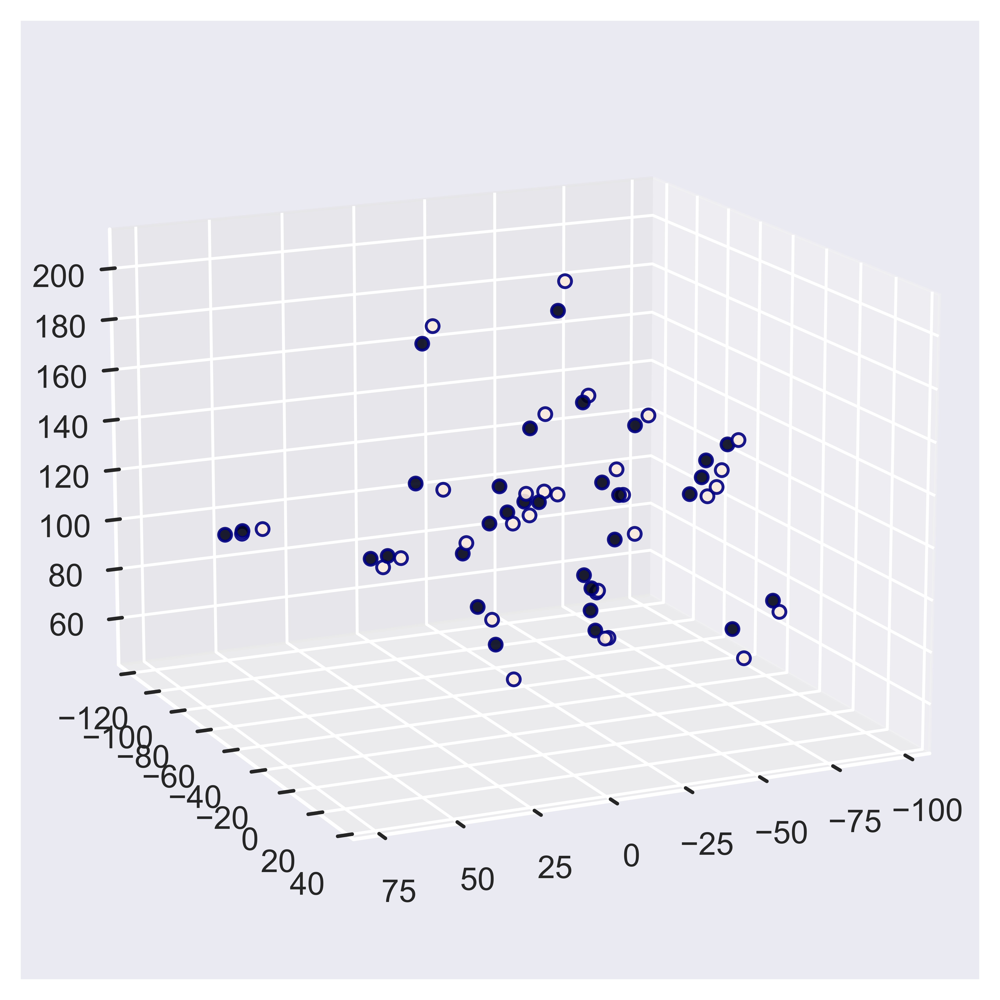

In [74]:
# Check approximation accuracy by PCA in 3D
sns.set_style("darkgrid")

X = pd.concat((np.log2(1.+(2.**gide_cpm*(meaninvlen))),np.log2(1.+gide_tpm)), axis=1)
X=X.T.values

batches = np.append(np.zeros(gide_cpm.shape[1]), np.ones(gide_tpm.shape[1]))

# plot the first three PCA dimensions
fig = plt.figure(1, figsize=(6,6), dpi=1200)
ax = fig.add_subplot(111, projection="3d", elev=15, azim=65)

cmap = plt.get_cmap('Set3')
new_cmap = truncate_colormap(cmap, 0.2, 0.6)

ss = StandardScaler()
# X = ss.fit_transform(X)


n_pca_components = 3
pcax = PCA(n_components=n_pca_components)
pcax.fit(X)
X_reduced = np.dot(X, pcax.components_.T)

scatter = ax.scatter(
    X_reduced[:, 0],
    X_reduced[:, 1],
    X_reduced[:, 2],
    c=batches,
    edgecolor="Navy",
    s=20,
    alpha=0.9
    
)

In [75]:
# Include only pre-therapy samples
pre_th = ['CTLA4-pre', 'CTLA4-to-PD1-pre',  'Combo-pre',  'PD1-pre', 'CTLA4-to-PD1', 'PD1-to-CTLA4']
regimen_names = ['PD1', 'PDL1', 'Combo','CTLA4-to-PD1'	]

#Only ipi-naive, pre-therapy samples of cutaneous melanoma
metadata = metadata[(metadata['previous.treatment'].values=='ipi-naive')&((metadata['sample.tumor.type'].values=='cutaneous')|(metadata['sample.tumor.type'].values=='unknown'))&(metadata['timepoint.id'].isin(pre_th))]

#Samples with Best Overall Response data available
metadata = metadata[metadata['bor'].isin(['PD','SD','PR','CR'])]

cpm = cpm[metadata.index.tolist()]

In [76]:
# Scale the unique checkmate cohorts 
cm64_pt = [column for column in cpm.columns if column.endswith('_064')]
cm67_pt = [column for column in cpm.columns if column.endswith('_067')]
cm38_pt = [column for column in cpm.columns if column.endswith('_038')]

cm64 = cpm[cm64_pt]
cm67 = cpm[cm67_pt]
cm38 = cpm[cm38_pt]

cm64 = cm64.loc[np.intersect1d(gide_cpm.index.values,gide_ipipd1.index.values)]
cm67 = cm67.loc[np.intersect1d(gide_cpm.index.values,gide_ipipd1.index.values)]
cm38 = cm38.loc[np.intersect1d(gide_cpm.index.values,gide_ipipd1.index.values)]

inv_len = gide_tpm/(2.**gide_cpm)
meaninvlen=np.mean(inv_len,axis=1).values.reshape(-1,1)

cm38 = (2.**cm38)*(meaninvlen)
cm64 = (2.**cm64)*(meaninvlen)
cm67 = (2.**cm67)*(meaninvlen)

metadata38 = metadata.loc[cm38_pt]
metadata64 = metadata.loc[cm64_pt]
metadata67 = metadata.loc[cm67_pt]

In [77]:
clin_data_cm38 = clin_data.loc[metadata38['subject.id'].tolist()]
clin_data_cm64 = clin_data.loc[metadata64['subject.id'].tolist()]
clin_data_cm67 = clin_data.loc[metadata67['subject.id'].tolist()]

In [78]:
cm38_ir = metadata38['bor']
cm64_ir = metadata64['bor']
cm67_ir = metadata67['bor']

cm38_os_days = 30.44*clin_data_cm38['os']
cm64_os_days = 30.44*clin_data_cm64['os']
cm67_os_days = 30.44*clin_data_cm67['os']

cm38_pfs_days = 30.44*clin_data_cm38['pfs']
cm64_pfs_days = 30.44*clin_data_cm64['pfs']
cm67_pfs_days = 30.44*clin_data_cm67['pfs']


### There is overlap in Newell and Gide

In [79]:
newell_gide_overlap_mela = np.array(['MELA_0395','MELA_0394','MELA_0440','MELA_0383','MELA_0364','MELA_0443',
                                     'MELA_0407','MELA_0363','MELA_0455','MELA_0372','MELA_0469','MELA_0390',
                                     'MELA_0458','MELA_0388','MELA_0370','MELA_0361','MELA_0430',
                                     'MELA_0413','MELA_0415','MELA_0366','MELA_0384','MELA_0376','MELA_0507',
                                     'MELA_0373','MELA_0360','MELA_0368','MELA_0374','MELA_0377','MELA_0387',
                                     'MELA_0378','MELA_0381','MELA_0557','MELA_0255'])

In [80]:
newell_gide_overlap_ipipd_pre = np.array(['ipiPD1_1_PRE','ipiPD1_13_PRE','ipiPD1_14_PRE','ipiPD1_19_PRE',
                                          'ipiPD1_23_PRE','ipiPD1_27_PRE','ipiPD1_32_PRE','ipiPD1_33_PRE',
                                          'ipiPD1_36_PRE','ipiPD1_38_PRE','ipiPD1_47_PRE','ipiPD1_49_PRE',
                                          'ipiPD1_50_PRE','ipiPD1_8_PRE','PD1_12_PRE','PD1_16_PRE','PD1_18_PRE',
                                          'PD1_21_PRE','PD1_25_PRE','PD1_29_PRE','PD1_3_PRE','PD1_35_PRE',
                                          'PD1_36_PRE','PD1_38_PRE','PD1_40_PRE','PD1_42_PRE','PD1_46_PRE',
                                          'PD1_48_PRE','PD1_49_PRE','PD1_50_PRE','PD1_52_PRE','PD1_7_PRE',
                                          'PD1_9_PRE'])

In [81]:
print(len(newell_gide_overlap_mela))
print(len(newell_gide_overlap_ipipd_pre))

33
33


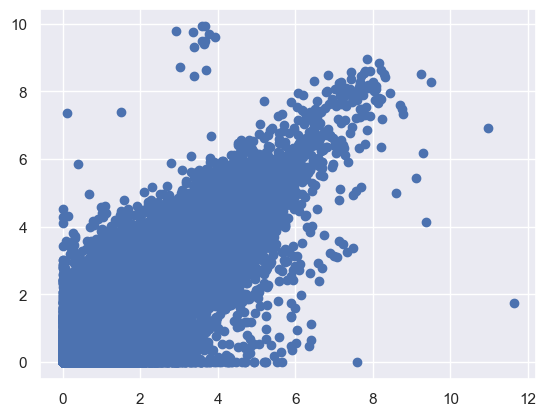

In [82]:
# The xpr data for the same patient is not identical in the two datasets, but it is correlated  
plt.scatter(np.log(1+gide_ipipd1['ipiPD1_1_PRE'].values),np.log(1+newell['MELA_0395'].values.astype(float)))
plt.show()

In [83]:
newell[list(np.setdiff1d(newell_pt,newell_gide_overlap_mela))]

,MELA_0228,MELA_0357,MELA_0359,MELA_0365,MELA_0367,MELA_0369,MELA_0379,MELA_0380,MELA_0382,MELA_0386,...,MELA_0436,MELA_0441,MELA_0444,MELA_0445,MELA_0446,MELA_0447,MELA_0472,MELA_0552,MELA_0562,MELA_0608
target_id,,,,,,,,,,,,,,,,,,,,,
A1BG,21.7195938928,36.857022,22.159196,59.151599,26.168931,22.50591,26.294918,39.977018,27.2331082,20.803526,...,48.76572,32.330713,37.137003,2.5231759,3.005718,17.023155,32.197089,18.244598,28.3212090090013,20.014254
A1CF,0,0.039879000307865,0.0032789200332817,0.01032052,0.0247968,0.01304184,0.101981401841,0.017097340474534,0.021459600186443,0.00626242,...,0,0.0207872000576048,0.00587036,0,0.0302886000422902,0.01570086,0.00939642,0.057051400179365,0.00502102,0.013785220168776
A2M,55.475498,165.225709,52.7032696,130.511335,62.812674,84.6339780027097,168.308707,143.556067,74.927774,163.71006,...,80.61944,183.3344806,308.984442,960.406281,404.85099,247.680781,265.805928,157.038717,917.748568,236.72294
A2ML1,0.1616974,0.2167058,0.271022423,0.4344060135,0.2867923,0.6549585,0.2385939,0.297317,0.2940037,0.0935486,...,0.882268,0.47367717,0.1487485,0.2187312,0.0902309,0.6613719,1.056994,0.2747419,0.721126,0.1779661
A2MP1,0.619589,0.3625949,0.2214598,0.499996,0.1033925,1.8613272,0.427603,0.788438,0.1291773,0.851358,...,0,0.2406817,0.0671085,1.69174,0.290919,1.2406093,0.270739,0.2041025,4.393107,0.195881
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZYG11AP1,0,0,0.797517,0,0,5.36058,0,0,0,0,...,0,0.581077,0.0399562,0.689222,0,0,0.188355,0.710243,0,0.486786
ZYG11B,13.161273,11.8912,4.125882,11.2226,5.715816,27.874949,2.9822959,13.722089,10.098906,11.3312,...,19.2531,3.7100627,3.630214,5.5149634,5.36105698,20.7869,12.198295,8.1021606,6.0030645,5.126737
ZYX,40.2727176,51.74948,28.89632,46.703998,16.67178,10.1079951,81.6213583,41.8720195091751,34.163841,52.405598,...,89.38070110045,10.62820512,21.707683,31.9084036,180.949509,44.101562,41.075707,37.722169,93.016079,30.182545


In [84]:
newell_pt = newell.keys()[newell.keys().isin(list(np.setdiff1d(newell_pt,newell_gide_overlap_mela)))]
newell_ir = newell_ir[newell.keys().isin(list(np.setdiff1d(newell_pt,newell_gide_overlap_mela)))]

In [85]:
#Keep only the patients that not present in Gide
newell = newell[newell_pt]

In [86]:
# This leaves us 26 patients
newell.shape

(35587, 26)

### Include only genes with data in all cohorts (but make sure all necessary genes for analyses are included)

In [87]:
# Riaz dataframe does not contain gene names but they are as many as in Hugo (35587).
common_genes = np.intersect1d(hugo.index.values.astype('str'),gide_pd1.index.values.astype('str'))
common_genes = np.intersect1d(common_genes, liu.index.values.astype('str'))
common_genes = np.intersect1d(common_genes, newell.index.values[1:newell.shape[0]])

#Du et al has 70k+ genes but the overlap with other cohorts is limited. I could not track this to different system of naming the genes  
# common_genes = np.intersect1d(common_genes, du.index.values.astype('str'))

common_genes = np.intersect1d(common_genes, cm38.index.values.astype('str'))
common_genes = np.intersect1d(common_genes, cm64.index.values.astype('str'))
common_genes = np.intersect1d(common_genes, cm67.index.values.astype('str'))
common_genes_inds = np.where(np.isin(hugo.index.values.astype('str'),common_genes))[0]
common_genes_inds.shape

(18595,)

In [88]:
Impres_genes=np.unique(['PDCD1', 'CD27', 'CTLA4', 'CD40', 'CD86', 'CD28', 'CD80', 'CD274', 'CD86', 'CD40', 'CD86', 'CD40', 'CD28', 
                        'CD40', 'TNFRSF14','TNFSF4', 'PDCD1', 'TNFSF4', 'CD28', 'TNFSF4', 'CD86', 'TNFSF9', 'VSIR', 'HAVCR2', 'PDCD1', 
                        'CD200', 'CD80', 'CD276', 'CD274', 'CD86'])

missing_gsp_psp_genes = ['HLA-DPA1', 'KIR3DX1', 'NAPSB', 'NCF1B', 'NCF1C', 'RARRES3', 'SEPT6', 'TRGV10']

required_genes = np.append(Impres_genes,missing_gsp_psp_genes)

In [89]:
np.setdiff1d(common_genes,cm38.index.values)

array([], dtype=object)

In [90]:
np.setdiff1d(common_genes,cm64.index.values)

array([], dtype=object)

In [91]:
np.setdiff1d(common_genes,cm67.index.values)

array([], dtype=object)

In [92]:
for gene in required_genes:
    
    if sum(common_genes==gene)==0:

        common_genes = np.append(common_genes, gene)
        print(gene,' appended')
        
common_genes = np.sort(common_genes)
common_genes_inds = np.where(np.isin(hugo.index.values.astype('str'),common_genes))[0]

HLA-DPA1  appended
RARRES3  appended


In [93]:
du_missing_genes = np.setdiff1d(common_genes,du.index.values)
du_common = np.intersect1d(common_genes,du.index.values)
len(du_missing_genes), len(du_common)

(2871, 15726)

In [94]:
du_missing_genes

array(['AACSP1', 'ABCA11P', 'ABCC6P1', ..., 'ZSCAN12P1', 'ZSCAN5DP',
       'ZSWIM9'], dtype=object)

In [95]:
hugoDF = hugo.loc[common_genes]
riazDF = riaz.iloc[common_genes_inds,:]
riazDF.index = common_genes
liuDF = liu.loc[common_genes]
gideMonoDF = gide_pd1.loc[common_genes] 
gideCombinationDF = gide_ipipd1.loc[common_genes] 
newellDF = newell.loc[common_genes] 

cm38.loc['HLA-DPA1'] = np.nan*np.ones(cm38.shape[1])
cm38.loc['RARRES3'] = np.nan*np.ones(cm38.shape[1])

cm64.loc['HLA-DPA1'] = np.nan*np.ones(cm64.shape[1])
cm64.loc['RARRES3'] = np.nan*np.ones(cm64.shape[1])

cm67.loc['HLA-DPA1'] = np.nan*np.ones(cm67.shape[1])
cm67.loc['RARRES3'] = np.nan*np.ones(cm67.shape[1])

cm38DF = cm38.loc[common_genes]
cm64DF = cm64.loc[common_genes]
cm67DF = cm67.loc[common_genes]
# vanallenDF = vanallen.loc[common_genes] 

In [96]:
combinedTPM_df = pd.concat((hugoDF,riazDF),axis=1)
combinedTPM_df = pd.concat((combinedTPM_df,liuDF),axis=1)
combinedTPM_df = pd.concat((combinedTPM_df,gideMonoDF),axis=1)
combinedTPM_df = pd.concat((combinedTPM_df,gideCombinationDF),axis=1)
combinedTPM_df = pd.concat((combinedTPM_df,newellDF),axis=1)

# Du is excluded because there is limited overlap with the other gene sets
# combinedTPM_df = pd.concat((combinedTPM_df,duDF),axis=1)

combinedTPM_df = pd.concat((combinedTPM_df,cm38DF),axis=1)
combinedTPM_df = pd.concat((combinedTPM_df,cm64DF),axis=1)
combinedTPM_df = pd.concat((combinedTPM_df,cm67DF),axis=1)


In [97]:
nan_locs= np.where(combinedTPM_df.isna())

In [98]:
#Since PCA in batch correction does not accept NaN's, we mean-impute the missing values
nan_locs= np.where(combinedTPM_df.isna())

for idx in np.arange(len(nan_locs[0])):

    gene_mean = np.nanmean(combinedTPM_df.iloc[nan_locs[0][idx],:].values.astype(float))
    combinedTPM_df.iloc[nan_locs[0][idx],nan_locs[1][idx]] = gene_mean

In [99]:
#Save original patient names for future reference
combinedTPM_orig_pt_ids = combinedTPM_df.keys().values.copy()

In [100]:
combinedTPM_df

,Pt1,Pt2,Pt4,Pt5,Pt6,Pt7,Pt8,Pt9,Pt10,Pt12,...,EA771327_rna_067,EA771328_rna_067,EA771332_rna_067,EA771333_rna_067,EA771862_rna_067,EA771888_rna_067,EA771911_rna_067,EA771922_rna_067,EA771939_rna_067,EA771940_rna_067
A1CF,0.016181,19.292158,0.004043,0.000000,0.027688,0.002404,0.025725,0.005685,0.008700,0.004638,...,0.028935,350.998480,0.049584,0.028935,0.028935,0.045361,0.067013,0.028935,0.028935,0.028935
A2M,291.567335,401.491662,61.382979,59.418722,103.623476,71.762388,120.485442,371.421257,684.491824,599.399648,...,1094.793112,996.999639,103.420439,76.086830,358.590809,1015.406474,90.648018,43.074470,132.920224,360.922437
A2ML1,0.146340,0.162822,0.107959,0.096282,0.047510,0.341070,0.285533,0.886448,0.293639,0.164851,...,1.368474,3.357577,0.538134,0.582815,0.381357,14.009206,2.803678,13.235033,3.945883,19.229951
A4GALT,13.087918,0.994899,1.688393,1.390282,1.779231,1.870975,6.910210,5.393488,46.148949,3.341831,...,1.863884,0.979590,3.356055,0.908366,3.858759,1.883055,1.078161,1.540569,5.434117,2.188894
A4GNT,0.089856,0.115751,0.022923,0.000000,0.000000,0.013695,0.022327,0.088229,0.059499,0.332578,...,0.290157,0.256624,0.127036,0.082313,0.076385,0.221145,0.163515,0.321928,0.036557,0.055323
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZXDC,11.387080,6.003711,7.810341,10.761769,5.144473,9.737623,6.106145,7.575190,10.577020,4.699261,...,15.828969,12.853853,12.188275,13.526870,14.591015,11.371561,12.216101,9.858783,10.625836,12.415872
ZYG11A,0.049619,0.094104,0.022896,0.015087,0.042131,1.931959,0.055826,0.026569,0.055722,0.059892,...,0.089838,0.475886,0.269629,0.030279,0.114725,0.218276,0.091637,0.315376,0.050078,0.142556
ZYG11B,7.572645,3.686440,2.139260,5.203337,3.027953,5.151130,4.245732,5.688560,4.885313,3.003909,...,11.738407,14.074927,14.602859,20.029001,10.228634,23.895627,17.267205,14.268583,19.847118,16.991881
ZYX,49.760389,17.890206,26.908258,40.289926,36.603424,10.919719,64.727203,39.872934,53.429098,212.477410,...,35.059635,10.707400,23.689702,32.292784,34.638417,20.682126,13.199968,21.419152,19.180642,13.861236


In [101]:
batch_inds = np.zeros(combinedTPM_df.shape[1])

endHugo = hugoDF.shape[1]
endRiaz = endHugo+riazDF.shape[1]
endLiu = endRiaz+liuDF.shape[1]
endGideMono = endLiu + gideMonoDF.shape[1]
endGideCombination = endGideMono + gideCombinationDF.shape[1]
endNewell = endGideCombination + newell.shape[1]
endcm38 = endNewell + cm38.shape[1]
endcm64 = endcm38  + cm64.shape[1]
endcm67 = endcm64 + cm67.shape[1]

batch_inds[0:endHugo]=1 #Hugo
batch_inds[endHugo:endRiaz]=2 #Riaz
batch_inds[endRiaz:endLiu] = 3 #Liu
batch_inds[endLiu:(endGideMono+endGideCombination)] = 4 #Gide
batch_inds[endGideCombination:endNewell] = 5 #Newell
batch_inds[endNewell:endcm38] = 6
batch_inds[endcm38:endcm64] = 7
batch_inds[endcm64:endcm67] = 8



In [103]:
np.save('./../Data/Preprocessing_TPM_data/batch_inds.npy',batch_inds)

In [104]:
#Rename the columns of combinedTPM_df by batch specific id's: HUGO.0, HUGO.1 etc.

combinedTPM_df.columns.values[batch_inds==1] = ['HUGO.'+ str(i) for i in np.arange(hugoDF.shape[1])]
combinedTPM_df.columns.values[batch_inds==2] = ['RIAZ.'+ str(i) for i in np.arange(riazDF.shape[1])]
combinedTPM_df.columns.values[batch_inds==3] = ['LIU.'+ str(i) for i in np.arange(liuDF.shape[1])]
combinedTPM_df.columns.values[batch_inds==4] = ['GIDE.'+ str(i) for i in np.arange(gideMonoDF.shape[1]+gideCombinationDF.shape[1])]
combinedTPM_df.columns.values[batch_inds==5] = ['NEWELL.'+ str(i) for i in np.arange(newell.shape[1])]
combinedTPM_df.columns.values[batch_inds==6] = ['CM38.'+ str(i) for i in np.arange(cm38.shape[1])]
combinedTPM_df.columns.values[batch_inds==7] = ['CM64.'+ str(i) for i in np.arange(cm64.shape[1])]
combinedTPM_df.columns.values[batch_inds==8] = ['CM67.'+ str(i) for i in np.arange(cm67.shape[1])]


In [105]:
combinedTPM_df = combinedTPM_df.astype(float)

In [106]:
#Save patient id key (orig id <~> batch-specific id)
pt_keyDF = pd.DataFrame(np.vstack((combinedTPM_df.keys().values,combinedTPM_orig_pt_ids)))
pt_keyDF.to_csv('./../Data/Preprocessing_TPM_data/combinedTPM_pt_id_key.csv')


In [107]:
#save combined TPM data
# Load data with pd.read_csv('/Users/oipulk/Documents/prime_data/preprocessed/combinedTPM_df.csv', index_col=0)
combinedTPM_df.to_csv('./../Data/Preprocessing_TPM_data/combinedTPM_df.csv')

## Batch correction

In [111]:
combinedTPM_df = pd.read_csv('./../Data/Preprocessing_TPM_data/combinedTPM_df.csv', index_col=0)

In [112]:
cohorts = np.array(['HUGO','RIAZ', 'LIU', 'GIDE', 'NEWELL' ,'CM38', 'CM64','CM67'])
# create a dictionary that maps numerical values to cohort labels from 0 to 4 (for colours in plots)
cohort_dict = {0: "Hugo", 1: "Riaz", 2: "Liu", 3: "Gide", 4: "Newell", 5: "Cm38",6: "Cm64", 7: "Cm67"}

In [110]:
batch_inds = np.load('./../Data/Preprocessing_TPM_data/batch_inds.npy')

### Define housekeeping genes
#### Human housekeeping genes revisited" by E. Eisenberg and E.Y. Levanon, Trends in Genetics, 29 (2013))

In [113]:
hk_genes_name_refseq = pd.read_csv('./../Data/Preprocessing_TPM_data/hk_genes.txt', sep='\t', header=None)
print(hk_genes_name_refseq.shape[0])

#Strip spaces
hk_genes_all = list([hk_genes_name_refseq.iloc[0,0].strip()])

for i in np.arange(1,hk_genes_name_refseq.shape[0]):
    
    hk_genes_all.append(hk_genes_name_refseq.iloc[i,0].strip())

3804


In [114]:
# Take only the genes that are on our list as well
hk_genes = list(np.intersect1d(hk_genes_all, combinedTPM_df.index.values))

In [115]:
len(hk_genes)

3505

In [116]:
#Shortlist from Eisenberg and Levanon
hk_genes_short = ['C1orf43', 'CHMP2A', 'EMC7', 'GPI', 'PSMB2', 'PSMB4', 'RAB7A' ,'REEP5', 'SNRPD3', 'VCP', 'VPS29']

### Select genes that are expressed at least in a subset of patients

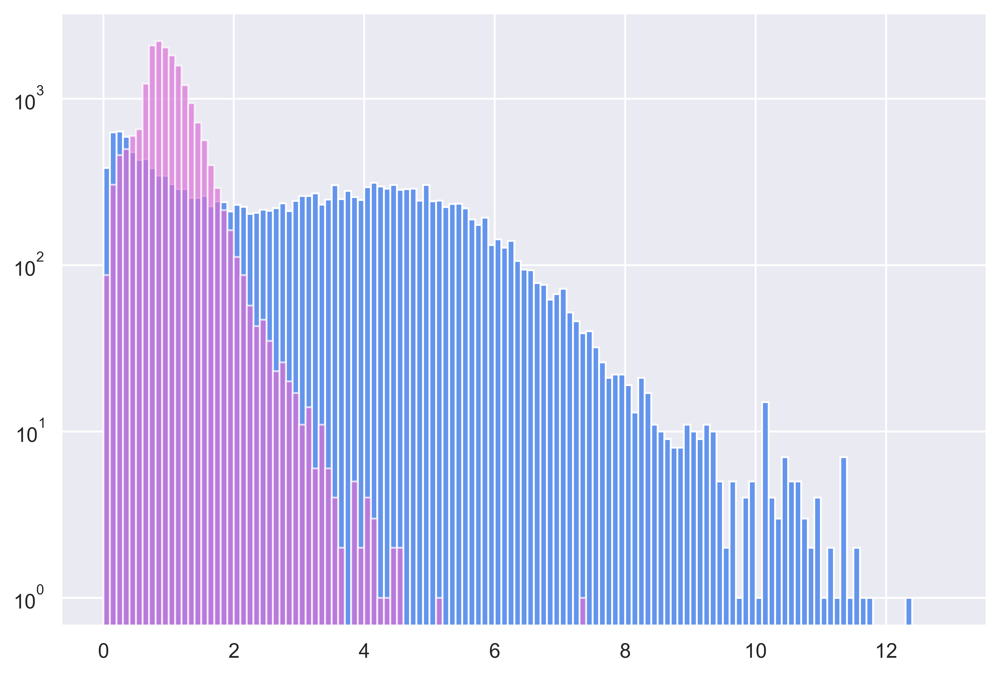

In [117]:
log2tpm_0 = np.log2(1.+combinedTPM_df)
sns.set_style("darkgrid")
plt.figure(figsize=(9,6), dpi=600)
plt.hist(np.mean(log2tpm_0,axis=1).values, bins=np.arange(0,13,0.1), color='cornflowerblue', alpha=1)
plt.hist(np.std(log2tpm_0,axis=1).values, bins=np.arange(0,13,0.1), color='orchid', alpha=0.7)
plt.yscale('log')
plt.show()

In [118]:
# Pick the genes which have mean tpm greater than 0.5 (so that it rounds up to 1) or have variance greater than 0.25. 
log2tpm = log2tpm_0.iloc[np.where((np.mean(log2tpm_0,axis=1).values>np.log2(1+0.5))|(np.sqrt(np.std(log2tpm_0,axis=1).values)>np.log2(1.+0.25)))[0],:]
log2tpm.index.values

array(['A1CF', 'A2M', 'A2ML1', ..., 'ZYG11B', 'ZYX', 'ZZEF1'],
      dtype=object)

In [119]:
# This choice will leave out only a few hk genes (the variability condition does not affect the number)
print(len(np.intersect1d(np.asarray(hk_genes),log2tpm.index.values)))
print(len(hk_genes))
hk_genes = np.intersect1d(np.asarray(hk_genes),log2tpm.index.values)

3505
3505


In [120]:
# The set of all genes is reduced to 19731
print(len(log2tpm.index.values))
print(len(log2tpm_0.index.values))

18500
18597


In [121]:
np.setdiff1d(log2tpm_0.index.values,log2tpm.index.values)

array(['ABCF2P1', 'AFG3L2P1', 'AMD1P2', 'API5P1', 'ARIH2P1', 'ARL6IP1P2',
       'BCLAF1P1', 'BTBD10P1', 'BTF3P4', 'BZW1P1', 'C10orf105',
       'C11orf87', 'CCT5P2', 'CCT6P2', 'CTAGE1', 'CYP51A1P1', 'DCAF13P1',
       'DDX3P3', 'DDX50P2', 'DHX9P1', 'DRD1', 'EIF3LP1', 'ESRRAP1',
       'FAM71C', 'FCF1P6', 'FDPSP1', 'FEM1AP2', 'FOXI2', 'FRMD8P1',
       'FSCB', 'GOT2P2', 'GPR151', 'GPR62', 'GYG1P3', 'HK2P1',
       'HNRNPA1P39', 'HNRNPH1P3', 'HNRNPLP1', 'HSP90AA4P', 'HSPA8P5',
       'HSPA8P9', 'HSPD1P9', 'KBTBD11', 'KCNJ9', 'KIF4B', 'KRT18P29',
       'KRT8P4', 'MIPEPP1', 'MROH5', 'NCOA4P4', 'NUTM1', 'NYX', 'PARP1P1',
       'PARP4P2', 'PCGF7P', 'PGDP1', 'PGGT1BP2', 'PKP4P1', 'PPATP1',
       'PRELID3BP10', 'PSMC1P4', 'PSMD12P', 'RAD51AP2', 'RANBP20P',
       'RBBP4P5', 'RBMXL2', 'RNASEH1P2', 'RPL5P29', 'RPS2P28', 'RSPH6A',
       'RTL3', 'SDAD1P2', 'SEPHS1P4', 'SH2D7', 'SHC1P2', 'SLC25A38P1',
       'SLC35D3', 'STIP1P3', 'SYNDIG1L', 'TAF1L', 'TCF3P1', 'TCP1P3',
       'TERF1P1', 'TERF

In [122]:
#Take only hk genes on our new list
hk_inds = np.where(log2tpm.index.values == hk_genes[0])
for ind in np.arange(1,len(hk_genes)):
    
    hk_inds = np.append(hk_inds,np.where(log2tpm.index.values == hk_genes[ind])[0][0])
    
print(len(hk_inds))
print(len(hk_genes))

3505
3505


### PCA with all genes before batch normalization

        PC1       PC2       PC3
0 -0.027950 -0.104530  0.182704
1 -0.385376  0.123807  0.107376
2 -0.197508 -0.226428  0.166045
3  0.119322 -0.376769  0.329567
4 -0.327233 -0.013394 -0.060198
Index(['SDHAF1', 'UQCR11', 'MRPL41', 'ADO', 'BOLA1', 'MRPL34', 'TMEM250',
       'MRPL55', 'CENPX', 'B3GALT6'],
      dtype='object')
Index(['RPL21', 'RPL36A', 'RPS18', 'NACA', 'RPL23A', 'RPS11', 'RPSA', 'RPL10A',
       'POLR2A', 'UBA52'],
      dtype='object')
Index(['MTRNR2L8', 'RPS17', 'MTRNR2L12', 'FAM83A', 'RPSAP58', 'ACBD6',
       'BMS1P4', 'FKBP6', 'NRG4', 'IGKV1D-39'],
      dtype='object')


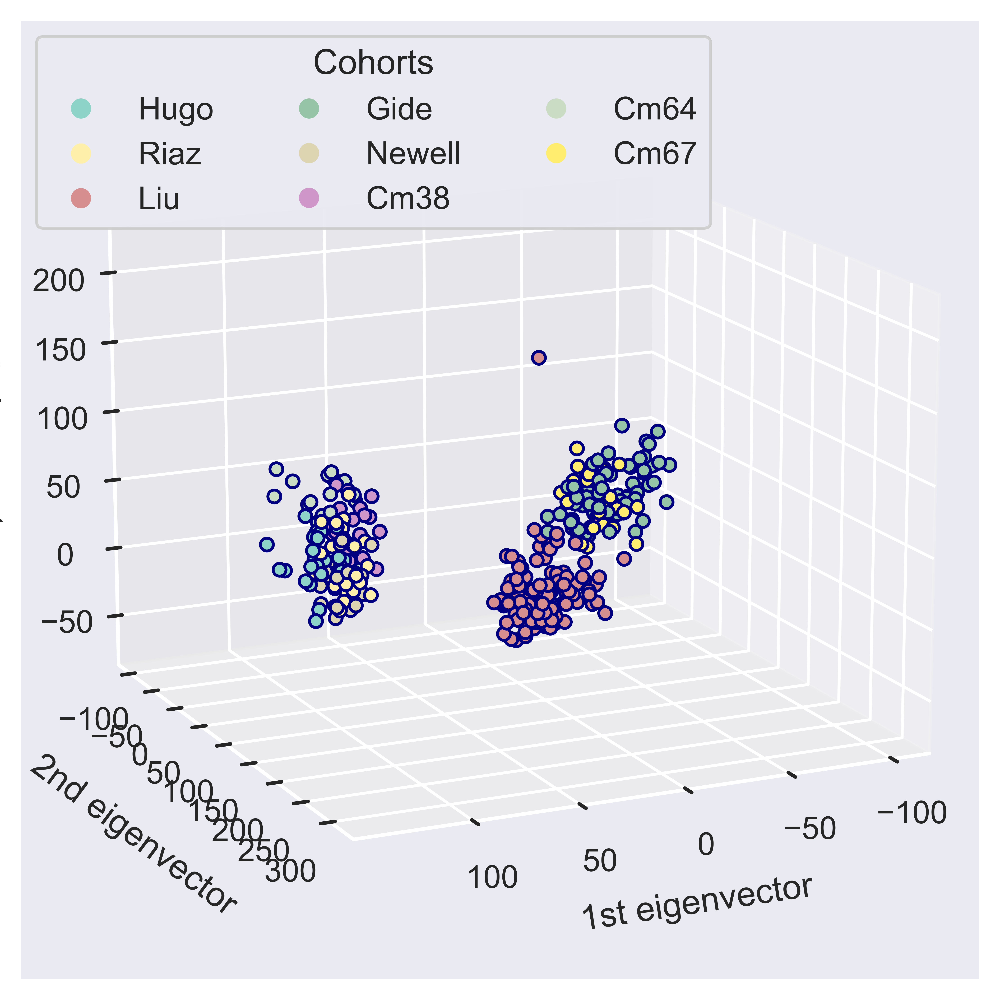

In [123]:
## PCA in 3D
sns.set_style("darkgrid")

X = log2tpm.T.values  

# plot the first three PCA dimensions
fig = plt.figure(1, figsize=(6,6), dpi=1200)
ax = fig.add_subplot(111, projection="3d", elev=15, azim=65)

cmap = plt.get_cmap('Set3')
new_cmap = truncate_colormap(cmap, 0., 1.0,n=9)

ss = StandardScaler()
X = ss.fit_transform(X)

#PCA components will be derived from housekeeping data only
n_pca_components = 3
pca = PCA(n_components=n_pca_components)
pca.fit(X)
 
# Data projected onto the subspace spanned by principal components. No centering before, so subtract mean
X_reduced = np.dot(X, pca.components_.T)


loadings = pd.DataFrame(data=pca.components_.T * np.sqrt(pca.explained_variance_), 
    columns=[f'PC{i}' for i in range(1, X_reduced.shape[1] + 1)],
    index=np.arange(log2tpm.shape[0])
)


print(loadings.head())

print(log2tpm.iloc[np.argsort(loadings['PC1'].values)[::-1]].index[0:10])
print(log2tpm.iloc[np.argsort(loadings['PC2'].values)[::-1]].index[0:10])
print(log2tpm.iloc[np.argsort(loadings['PC3'].values)[::-1]].index[0:10])

scatter = ax.scatter(
    X_reduced[:, 0],
    X_reduced[:, 1],
    X_reduced[:, 2],
    c=batch_inds-1,
    cmap=new_cmap,
    edgecolor="Navy",
    s=20,
    alpha=1,
    label="Cohorts"
)

# ax.set_title("PCA: No Batch Correction")
ax.set_xlabel("1st eigenvector",labelpad=8)
# ax.xaxis.set_ticklabels([])
ax.set_ylabel("2nd eigenvector",labelpad=8)
# ax.yaxis.set_ticklabels([])
ax.set_zlabel("3rd eigenvector",labelpad=8)
# ax.zaxis.set_ticklabels([])


# create a custom legend using the dictionary
legend1 = ax.legend(*scatter.legend_elements(),ncol=3,
                    loc="upper left", title="Cohorts")

for i in np.arange(len(cohorts)):
    legend1.get_texts()[i].set_text(cohort_dict[i])

ax.add_artist(legend1)

# plt.savefig("pca_all_genes_no_batch_correction.pdf", format='pdf')

plt.show()

/Users/oipulk/miniconda3/envs/py3/lib/python3.10/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


(337, 2)


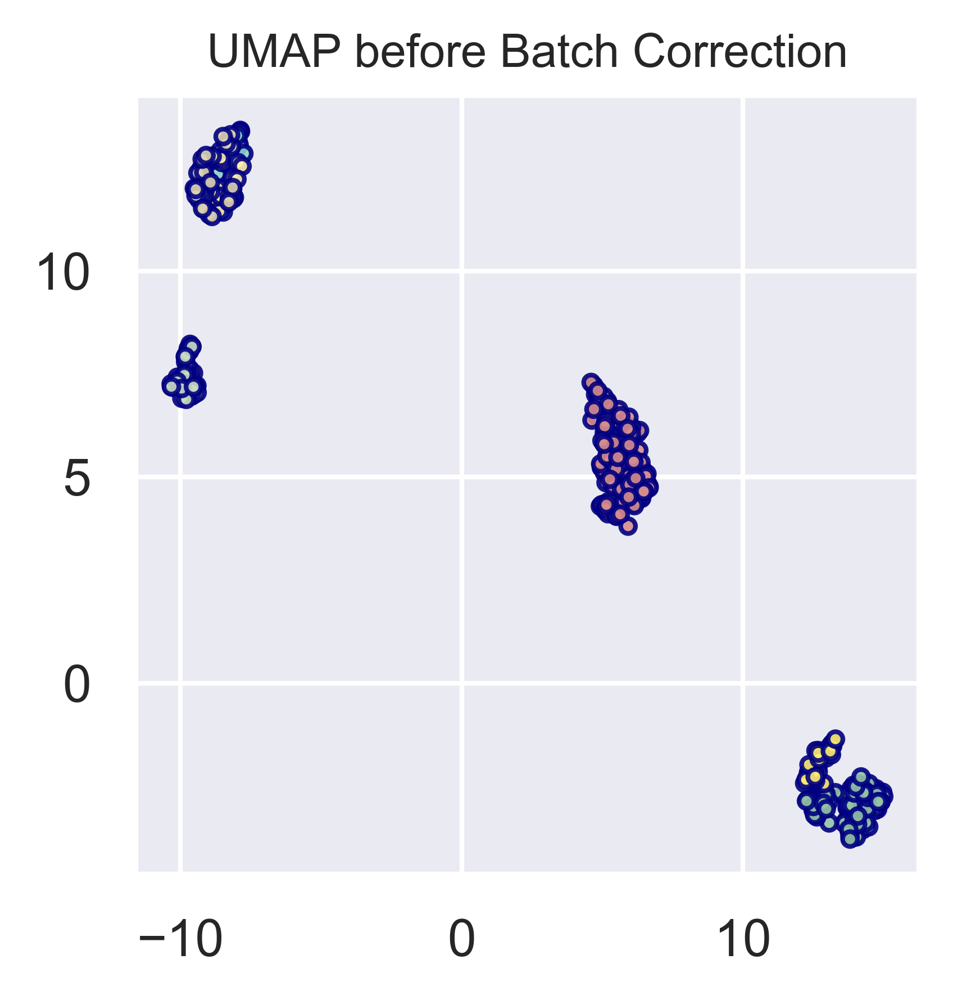

In [124]:
X = log2tpm.T.values  

# plot the first three PCA dimensions
plt.figure(1, figsize=(3,3), dpi=600)


ss = StandardScaler()
X = ss.fit_transform(X)

umap_embedding = UMAP(random_state=42).fit_transform(X)
print(umap_embedding.shape)

# plt.scatter(embedding[:, 0], embedding[:, 1], c=irs.T.values/4., cmap='coolwarm')
plt.scatter(umap_embedding[:, 0], umap_embedding[:, 1],c=batch_inds-1,
    cmap=new_cmap,
    edgecolor="Navy",
    s=10,
    alpha=0.9,
    label="Cohorts")

legend1 = ax.legend(*scatter.legend_elements(),ncol=3,
                    loc="upper left", title="Cohorts")

for i in np.arange(len(cohorts)):
    legend1.get_texts()[i].set_text(cohort_dict[i])

ax.add_artist(legend1)

plt.title('UMAP before Batch Correction', fontsize=10)

# plt.savefig("umap_all_genes_no_batch_correction.pdf", format='pdf')

plt.show()

### PCA of housekeeping genes prior batch correction

        PC1       PC2       PC3
0  0.501576 -0.276279 -0.021585
1  0.207936 -0.566190  0.196599
2 -0.441464 -0.456809  0.019772
3 -0.690007 -0.308131 -0.169609
4  0.441374 -0.365936 -0.217201
Index(['RANBP2', 'ATXN2', 'HELZ', 'NIPBL', 'ITCH', 'USP9X', 'NCOR1', 'ZNF91',
       'PHKB', 'HUWE1'],
      dtype='object')
Index(['RNF126', 'C6orf226', 'TPGS1', 'RPL35', 'PIH1D1', 'BAD', 'FBXL15',
       'ZNF787', 'PRDX5', 'UBA52'],
      dtype='object')
Index(['GLRX5', 'ARL5A', 'KCTD21', 'PTGES3', 'RAB6A', 'AGPS', 'CBR4', 'ACBD6',
       'HIGD1A', 'DCTD'],
      dtype='object')


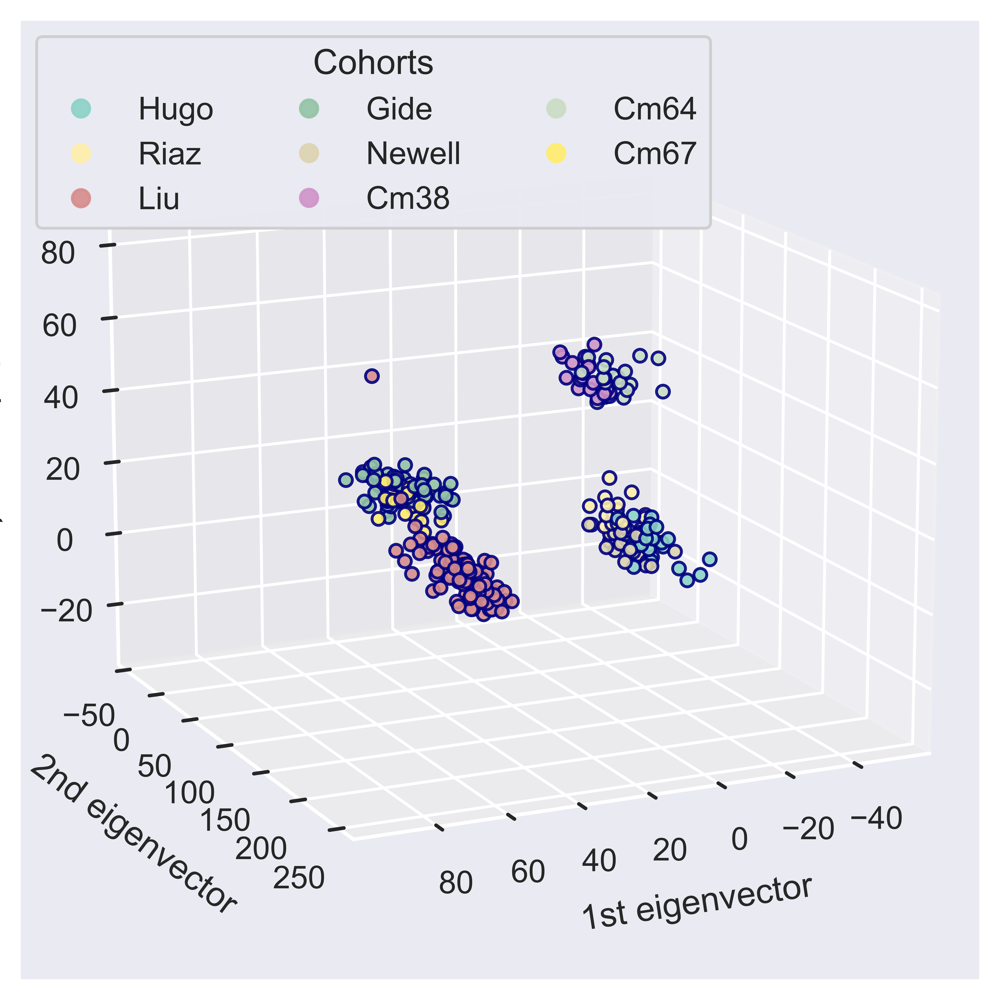

In [125]:

sns.set_style("darkgrid")

data = log2tpm.T.values

#Center and scale
mean_data_vec = np.mean(data, axis=0)
std_data_vec = np.std(data, axis=0)
data = (data-np.mean(data, axis=0))/np.std(data, axis=0)
# data = (data-np.mean(data, axis=0))

X = data[:,hk_inds]

# plot the first three PCA dimensions
fig = plt.figure(1, figsize=(6,6), dpi=1200)
ax = fig.add_subplot(111, projection="3d", elev=15, azim=65)

n_pca_components = 3
pca = PCA(n_components=n_pca_components, svd_solver='full')
pca.fit(X)

X_reduced = np.dot(X, pca.components_.T)

loadings = pd.DataFrame(data=pca.components_.T * np.sqrt(pca.explained_variance_), 
    columns=[f'PC{i}' for i in range(1, X_reduced.shape[1] + 1)],
    index=np.arange(log2tpm.iloc[hk_inds,:].shape[0])
)


print(loadings.head())

print(log2tpm.iloc[hk_inds,:].iloc[np.argsort(loadings['PC1'].values)[::-1]].index[0:10])
print(log2tpm.iloc[hk_inds,:].iloc[np.argsort(loadings['PC2'].values)[::-1]].index[0:10])
print(log2tpm.iloc[hk_inds,:].iloc[np.argsort(loadings['PC3'].values)[::-1]].index[0:10])


scatter = ax.scatter(
    X_reduced[:, 0],
    X_reduced[:, 1],
    X_reduced[:, 2],
    c=batch_inds-1,
    cmap=new_cmap,
    edgecolor="Navy",
    s=20,
    alpha=0.9,
    label="Cohorts"
)

# ax.set_title("Housekeeping genes: No Scaling")
ax.set_xlabel("1st eigenvector",labelpad=8)
# ax.xaxis.set_ticklabels([])
ax.set_ylabel("2nd eigenvector",labelpad=8)
# ax.yaxis.set_ticklabels([])
ax.set_zlabel("3rd eigenvector",labelpad=8)
# ax.zaxis.set_ticklabels([])

# create a custom legend using the dictionary
legend1 = ax.legend(*scatter.legend_elements(),ncol=3,
                    loc="upper left", title="Cohorts")
for i in np.arange(len(cohorts)):
    legend1.get_texts()[i].set_text(cohort_dict[i])

ax.add_artist(legend1)

# plt.savefig("pca_hk_genes_no_batch_correction.pdf", format='pdf')

plt.show()

# Batch scaling of principal components by housekeeping genes

### PCA autoencoding of all 19k genes and batch mean from HK genes

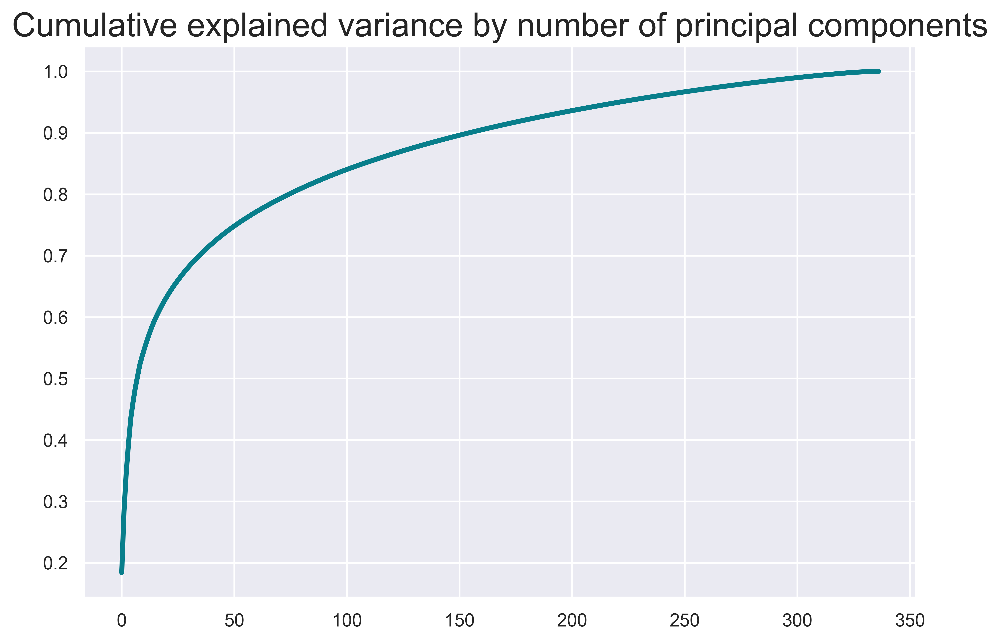

        PC1       PC2       PC3       PC4       PC5       PC6       PC7  \
0 -0.027950 -0.104530  0.182704  0.051706  0.026627  0.097002 -0.037754   
1 -0.385376  0.123807  0.107376 -0.215703  0.209766 -0.149579  0.019939   
2 -0.197508 -0.226428  0.166046  0.026617  0.066713  0.329596 -0.310184   
3  0.119322 -0.376769  0.329566 -0.357329  0.334762  0.029010 -0.301168   
4 -0.327233 -0.013394 -0.060199 -0.100699  0.180764  0.005947 -0.172707   

        PC8       PC9      PC10  ...     PC328     PC329     PC330     PC331  \
0 -0.181593  0.193736  0.617043  ... -0.000270  0.001336 -0.001141 -0.003631   
1  0.067941 -0.051725  0.272981  ... -0.005771 -0.000137  0.001954  0.001148   
2 -0.492506 -0.248055 -0.360538  ...  0.010308 -0.001641 -0.006215  0.021188   
3  0.030333 -0.191532  0.060844  ...  0.027391 -0.027317 -0.011741 -0.010591   
4  0.059276 -0.010772  0.061176  ...  0.007110  0.000157  0.027482 -0.023686   

      PC332     PC333     PC334     PC335     PC336         PC337  


In [126]:
batches = np.arange(1,10)
data = log2tpm.T.values

#Center and scale
mean_data_vec = np.mean(data, axis=0)
std_data_vec = np.std(data, axis=0)

#Scaling by std leads to greater separation after scaling (CHECK THIS)
data = (data-np.mean(data, axis=0))/np.std(data, axis=0)

# the number of components used in correction (increase until batches merge)
max_component = 3

#housekeeping genes
data_hk = data[:,hk_inds]

# Find principal components
n_pca_components = data.shape[0]
pca = PCA(n_components=n_pca_components, svd_solver='full')
pca.fit(data)

# Represent data in the basis of principal components
data_reduced = np.dot(data, pca.components_.T)

#Corresponding dataframe
log2tpm_reduced = pd.DataFrame(data=data_reduced.T)

sns.set_style("darkgrid")
plt.figure(figsize=(9,6), dpi=600)

plt.plot(pca.explained_variance_ratio_.cumsum()[0:n_pca_components], lw=3, color='#087E8B')
plt.title('Cumulative explained variance by number of principal components', size=20)
plt.show()

loadings = pd.DataFrame(
    data=pca.components_.T * np.sqrt(pca.explained_variance_), 
    columns=[f'PC{i}' for i in range(1, data_reduced.shape[1] + 1)],
    index=np.arange(log2tpm.shape[0])
)
print(loadings.head())

print(log2tpm.iloc[np.argsort(loadings['PC1'].values)[::-1]].index[0:10])
print(log2tpm.iloc[np.argsort(loadings['PC2'].values)[::-1]].index[0:10])
print(log2tpm.iloc[np.argsort(loadings['PC3'].values)[::-1]].index[0:10])

In [127]:
# housekeeping data represented in the basis of PCs 
data_hk_reduced = np.dot(data_hk, pca.components_.T[hk_inds , :]/np.sqrt(np.sum(pca.components_.T[hk_inds,:]**2.,axis=0)))

log2tpm_hk_reduced = pd.DataFrame(data=data_hk_reduced.T)

#Initialize batch-scaled DF
log2tpm_bs_reduced = log2tpm_reduced.copy()

# Scale variability (assuming Normal distribution) 
scaling_factor = np.sqrt(data.shape[1]/data_hk.shape[1])

for ind in batches:
    
#     # Find mean position of each batch in the latent space
    mean_delta_batch = log2tpm_reduced.loc[:, batch_inds==ind].mean(axis=1)
    
    # Mean position of each batch by housekeeping genes 
    mean_delta_hk_batch = log2tpm_hk_reduced.loc[:, batch_inds==ind].mean(axis=1)
    
    # Set the mean of higher components than max_component to zero so that they will not be corrected
    mean_delta_hk_batch.iloc[(max_component+1):mean_delta_hk_batch.shape[0]] = 0.

    # Adjust the mean position of each batch in the latent space 
    log2tpm_bs_reduced.iloc[:,batch_inds == ind] = (log2tpm_reduced.iloc[:,batch_inds== ind].sub(scaling_factor*mean_delta_hk_batch, axis=0))

# Inverse transform from latent variable to full set of genes, add mean (and multiply by std if data scaled by std originally) for original scale
log2tpm_bs_data = np.dot(log2tpm_bs_reduced.T, pca.components_)*std_data_vec + mean_data_vec
# log2tpm_bs_data = np.dot(log2tpm_bs_reduced.T, pca.components_) + mean_data_vec

# As a consequence of scaling, log2(1+data) may be negative in some cases. Remove those by correcting by the minimum value
log2tpm_bs_data = log2tpm_bs_data - np.min(log2tpm_bs_data)
tpm_bs_data = 2.**log2tpm_bs_data - 1.

print(np.min(tpm_bs_data))

log2tpm_bs = pd.DataFrame(columns = log2tpm.keys(), index=list(log2tpm.index.values), data=log2tpm_bs_data.T)
tpm_bs = pd.DataFrame(columns = log2tpm.keys(), index=list(log2tpm.index.values), data=tpm_bs_data.T)

log2tpm_bs.to_csv('./../Data/Preprocessing_TPM_data/log2tpm_batch_corrected_hkpca.csv')
tpm_bs.to_csv('./../Data/Preprocessing_TPM_data/tpm_batch_corrected_hkpca.csv')

0.0


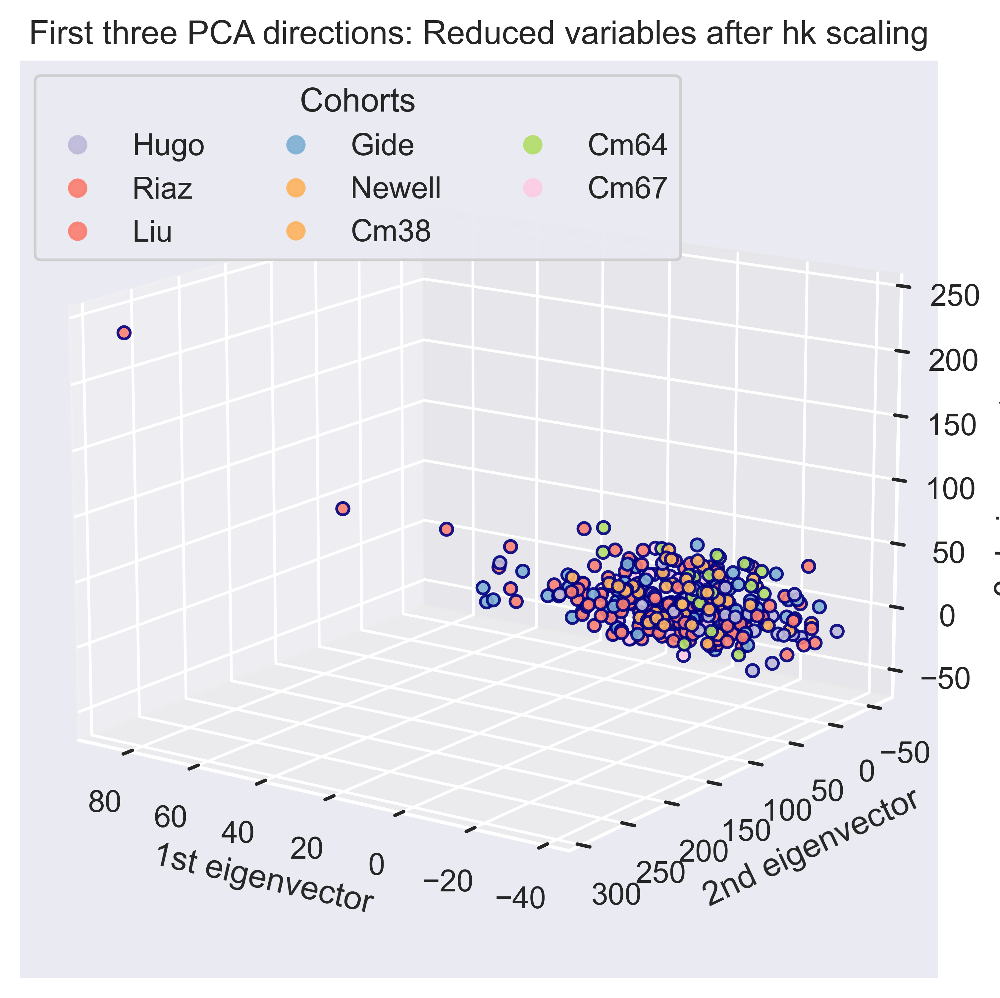

In [128]:
# Check how batches represented by housekeeping genes merge in the latent space

sns.set_style("darkgrid")

X_reduced = log2tpm_bs_reduced
X_reduced = X_reduced.T.values

# plot the first three PCA dimensions
fig = plt.figure(1, figsize=(6, 6), dpi=600)
ax = fig.add_subplot(111, projection="3d", elev=15, azim=125)

cmap = plt.get_cmap('Set3')
new_cmap = truncate_colormap(cmap, 0.2, 0.6)

# X_reduced = PCA(n_components=3).fit_transform(X)
scatter = ax.scatter(
    X_reduced[:, 0],
    X_reduced[:, 1],
    X_reduced[:, 2],
    c=batch_inds-1,
#     c=np.array(irs>2, dtype=int),
    cmap=new_cmap,
    edgecolor="Navy",
    s=20,
    alpha=0.9,
    label="Cohorts"
)

ax.set_title("First three PCA directions: Reduced variables after hk scaling")
ax.set_xlabel("1st eigenvector")
# ax.xaxis.set_ticklabels([])
ax.set_ylabel("2nd eigenvector")
# ax.yaxis.set_ticklabels([])
ax.set_zlabel("3rd eigenvector")
# ax.zaxis.set_ticklabels([])
\
# ax.axes.set_xlim3d(left=-100, right=100) 
# ax.axes.set_ylim3d(bottom=-100, top=100) 
# ax.axes.set_zlim3d(bottom=-100, top=100) 

# create a custom legend using the dictionary
legend1 = ax.legend(*scatter.legend_elements(),ncol=3,
                    loc="upper left", title="Cohorts")

for i in np.arange(len(cohorts)):
    legend1.get_texts()[i].set_text(cohort_dict[i])

ax.add_artist(legend1)

plt.show()

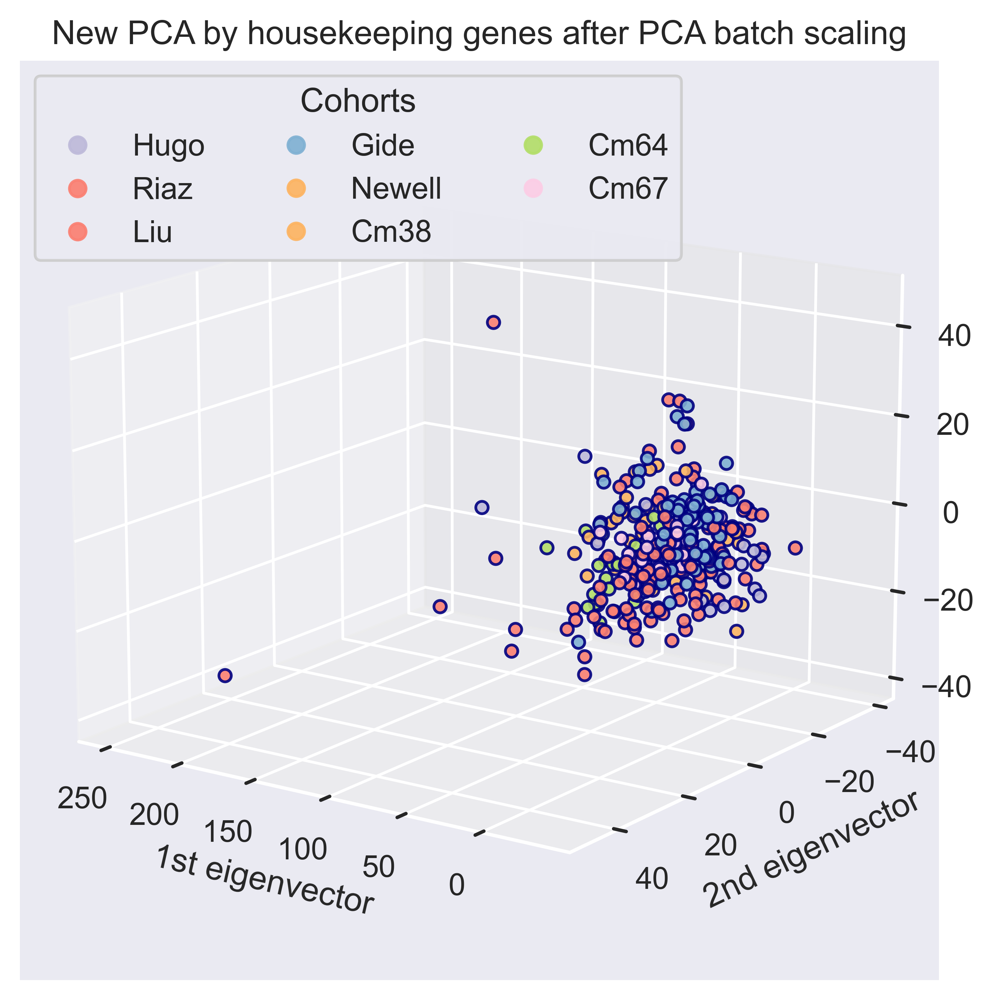

In [129]:
# New PCA by housekeeping genes after batch scaling

sns.set_style("darkgrid")
plt.figure(figsize=(9,6), dpi=600)


#Batch scaling by batch hk levels
X = log2tpm_bs.loc[hk_genes]

X = X.T.values

# plot the first three PCA dimensions
fig = plt.figure(1, figsize=(8, 6))
ax = fig.add_subplot(111, projection="3d", elev=15, azim=125)

cmap = plt.get_cmap('Set3')
new_cmap = truncate_colormap(cmap, 0.2, 0.6)

# ss = StandardScaler()
# X = ss.fit_transform(X)

X_reduced = PCA(n_components=3).fit_transform(X)
scatter = ax.scatter(
    X_reduced[:, 0],
    X_reduced[:, 1],
    X_reduced[:, 2],
    c=batch_inds-1,
#     c=np.array(irs>2, dtype=int),
    cmap=new_cmap,
    edgecolor="Navy",
    s=20,
    alpha=0.9,
    label="Cohorts"
)

ax.set_title("New PCA by housekeeping genes after PCA batch scaling")
ax.set_xlabel("1st eigenvector")
# ax.xaxis.set_ticklabels([])
ax.set_ylabel("2nd eigenvector")
# ax.yaxis.set_ticklabels([])
ax.set_zlabel("3rd eigenvector")
# ax.zaxis.set_ticklabels([])

# ax.axes.set_xlim3d(left=-100, right=100) 
# ax.axes.set_ylim3d(bottom=-100, top=100) 
# ax.axes.set_zlim3d(bottom=-100, top=100) 

# create a custom legend using the dictionary
legend1 = ax.legend(*scatter.legend_elements(),ncol=3,
                    loc="upper left", title="Cohorts")

for i in np.arange(len(cohorts)):
    legend1.get_texts()[i].set_text(cohort_dict[i])


ax.add_artist(legend1)

plt.show()

        PC1       PC2       PC3       PC4       PC5       PC6       PC7  \
0  0.018404  0.110159 -0.051969  0.025350  0.158381 -0.268964  0.073205   
1  0.006120  0.304308 -0.050793 -0.101875 -0.098962  0.106312  0.034638   
2 -0.112259  0.168913 -0.133831  0.189931  0.497702 -0.147309 -0.419690   
3 -0.299283  0.609953 -0.065558  0.025617  0.266139  0.185839  0.025258   
4 -0.139987  0.212993 -0.125455  0.137240  0.030447  0.087140  0.014922   

        PC8       PC9      PC10  
0  0.044743  0.440598 -0.167606  
1 -0.064561  0.317316 -0.234851  
2 -0.075605 -0.316292  0.209201  
3 -0.051085  0.010768 -0.086452  
4 -0.031243  0.044333 -0.091601  
Index(['CCDC54', 'LRRD1', 'RNF148', 'SLC27A6', 'PLEKHA3P1', 'PPP4R4',
       'RPS4XP7', 'RPL23', 'UQCRB', 'RPS20'],
      dtype='object')
Index(['NLRP1', 'PSD4', 'VAV1', 'PSTPIP1', 'CSF2RB', 'INPP5D', 'VSIR',
       'CAMK1D', 'CCND2', 'TTC7A'],
      dtype='object')
Index(['LONP1', 'TRABD', 'SCRIB', 'BRAT1', 'NUBP2', 'CCDC124', 'GIPC1',
      

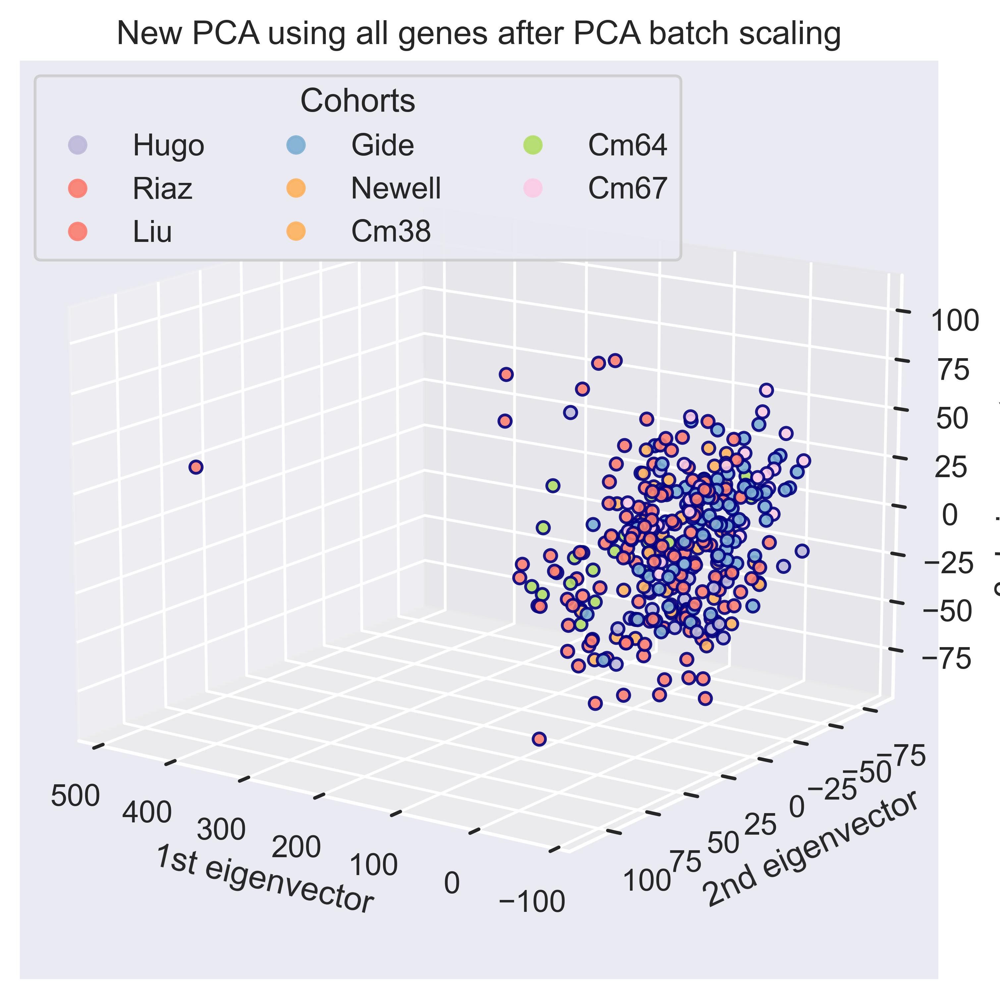

In [130]:
# PCA of all data after batch correction

sns.set_style("darkgrid")
plt.figure(figsize=(9,6), dpi=600)


#Batch scaling by batch hk levels
X = log2tpm_bs

X = X.T.values

# Zero mean ...
# X = (X - np.mean(X,axis=0))

# ... or Z score
X = (X - np.mean(X,axis=0))/np.std(X,axis=0)

# plot the first three PCA dimensions
fig = plt.figure(1, figsize=(8, 6))
ax = fig.add_subplot(111, projection="3d", elev=15, azim=125)

cmap = plt.get_cmap('Set3')
new_cmap = truncate_colormap(cmap, 0.2, 0.6)

n_pca_components = 10
pca = PCA(n_components=n_pca_components, svd_solver='full')
pca.fit(X)

X_reduced = np.dot(X, pca.components_.T)

loadings = pd.DataFrame(data=pca.components_.T * np.sqrt(pca.explained_variance_), 
    columns=[f'PC{i}' for i in range(1, X_reduced.shape[1] + 1)],
    index=np.arange(log2tpm.shape[0])
)

print(loadings.head())

loadings_hk = loadings

loadings_pc1_hk = loadings['PC1'].values
loadings_pc2_hk = loadings['PC2'].values
loadings_pc3_hk = loadings['PC3'].values

print(log2tpm.iloc[np.argsort(loadings_pc1_hk)[::-1]].index[0:10])
print(log2tpm.iloc[np.argsort(loadings_pc2_hk)[::-1]].index[0:10])
print(log2tpm.iloc[np.argsort(loadings_pc3_hk)[::-1]].index[0:10])

scatter = ax.scatter(
    X_reduced[:, 0],
    X_reduced[:, 1],
    X_reduced[:, 2],
    c=batch_inds-1,
#     c=np.array(irs>2, dtype=int),
    cmap=new_cmap,
    edgecolor="Navy",
    s=20,
    alpha=0.9,
    label="Cohorts"
)



ax.set_title("New PCA using all genes after PCA batch scaling")
ax.set_xlabel("1st eigenvector")
# ax.xaxis.set_ticklabels([])
ax.set_ylabel("2nd eigenvector")
# ax.yaxis.set_ticklabels([])
ax.set_zlabel("3rd eigenvector")
# ax.zaxis.set_ticklabels([])

# create a custom legend using the dictionary
legend1 = ax.legend(*scatter.legend_elements(),ncol=3,
                    loc="upper left", title="Cohorts")
for i in np.arange(len(cohorts)):
    legend1.get_texts()[i].set_text(cohort_dict[i])


ax.add_artist(legend1)

plt.show()

/Users/oipulk/miniconda3/envs/py3/lib/python3.10/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


(337, 2)


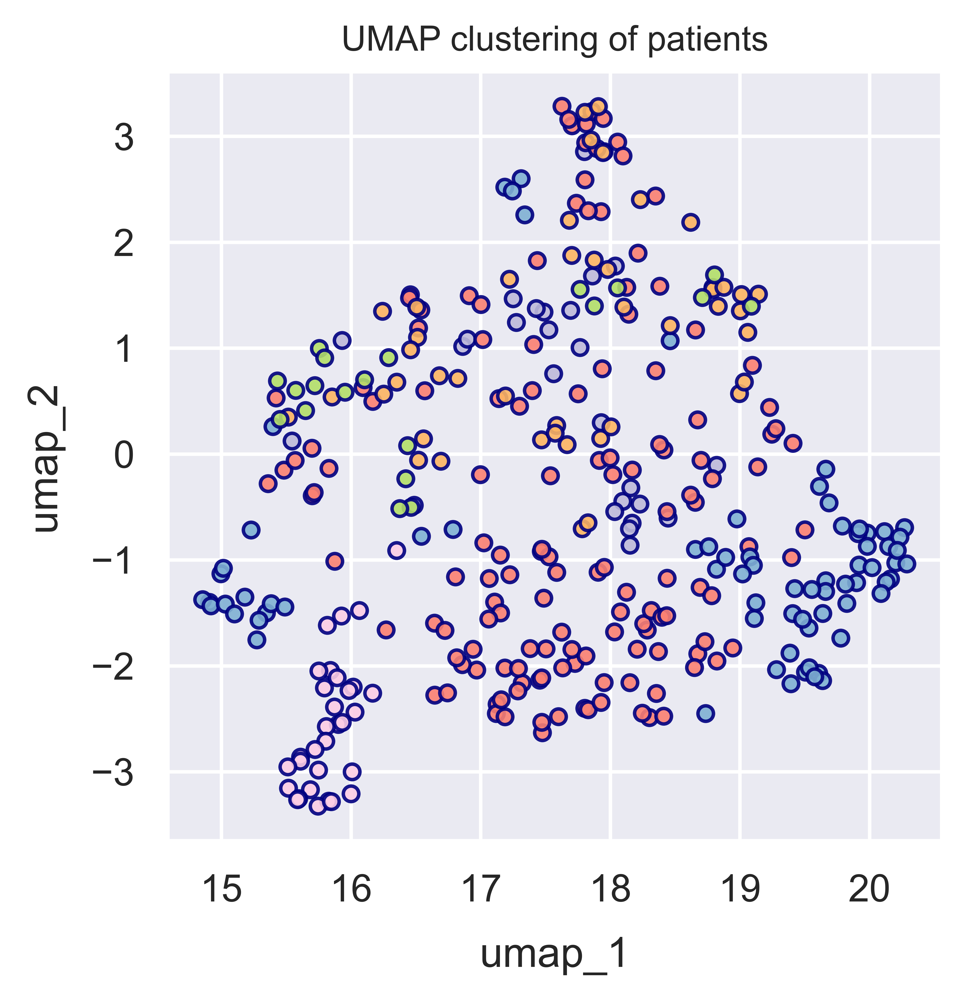

In [104]:
# UMAP of batch-corrected data

X = log2tpm_bs.T.values  

# plot the first three PCA dimensions
plt.figure(1, figsize=(4,4), dpi=1200)


cmap = plt.get_cmap('Set3')
new_cmap = truncate_colormap(cmap, 0.2, 0.6)

ss = StandardScaler()
X = ss.fit_transform(X)

umap_embedding = UMAP(random_state=42).fit_transform(X)
print(umap_embedding.shape)

# plt.scatter(embedding[:, 0], embedding[:, 1], c=irs.T.values/4., cmap='coolwarm')
plt.scatter(umap_embedding[:, 0], umap_embedding[:, 1],c=batch_inds-1,
    cmap=new_cmap,
    edgecolor="Navy",
    s=20,
    alpha=0.9,
    label="Cohorts")


plt.title('UMAP clustering of patients',fontsize=10)
plt.xlabel("umap_1",labelpad=8)
# ax.xaxis.set_ticklabels([])
plt.ylabel("umap_2",labelpad=8)
# ax.yaxis.set_ticklabels([])


# create a custom legend using the dictionary
legend1 = ax.legend(*scatter.legend_elements(),ncol=3,
                    loc="upper left", title="Cohorts")
for i in np.arange(len(cohorts)):
    legend1.get_texts()[i].set_text(cohort_dict[i])


plt.show()

## pyCombat-Seq would require raw counts because it is based on a negative binomial model. We can try and apply it on pseudo counts for comparison.

In [133]:
from combat.pycombat import pycombat

In [134]:
# Convert the matrix of 17k+ genes back to TPM to obtain pseudo counts
tpmDF = np.rint(2.**log2tpm-1).astype(int)


In [135]:
from inmoose.pycombat import pycombat_seq
tpm_bcDF = pycombat_seq(tpmDF,batch_inds)
tpm_bcDF.to_csv('./../Data/Preprocessing_TPM_data/tpm_pyCombatSeq.csv')
print(tpm_bcDF.shape)

[INFO] Found 8 batches
[INFO] Using null model
[INFO] Adjusting for 0 covariate(s) or covariate level(s)
[INFO] Estimating dispersions
[INFO] Fitting the GLM model
[INFO] shrinkage off - using GLM estimates for parameters
[INFO] Adjusting the data


(18500, 337)


        PC1       PC2       PC3       PC4       PC5       PC6       PC7  \
0 -0.069664  0.094503 -0.004262  0.040319  0.047419  0.160933  0.070305   
1 -0.236978  0.188047  0.245814  0.078227  0.000792 -0.062019  0.028802   
2 -0.281498  0.201238 -0.178680 -0.073926  0.233666  0.544943 -0.219169   
3 -0.366996  0.488467  0.238551 -0.061853  0.259799  0.043463 -0.185156   
4  0.086946  0.215718 -0.129019 -0.034918  0.065128 -0.086470 -0.100497   

        PC8       PC9      PC10  
0 -0.134474  0.071794  0.393304  
1 -0.009310 -0.035627  0.362772  
2  0.066533  0.093520 -0.369060  
3 -0.035788  0.010587  0.099599  
4 -0.032017 -0.165227 -0.007770  
Index(['RPL21P28', 'HIST1H1E', 'HIST1H4C', 'HIST2H2AC', 'HIST2H2AB', 'RPL12P4',
       'EIF4EP1', 'TAF9BP1', 'RPL9P7', 'KLHL11'],
      dtype='object')
Index(['WDFY4', 'PTGDR', 'NLRP1', 'ARRDC5', 'GVINP1', 'LRRC18', 'CMAHP',
       'PLCL2', 'E2F3P1', 'BLNK'],
      dtype='object')
Index(['CXCR3', 'GIMAP1', 'TOR4A', 'LYL1', 'SOWAHD', 'TNFAIP8L1

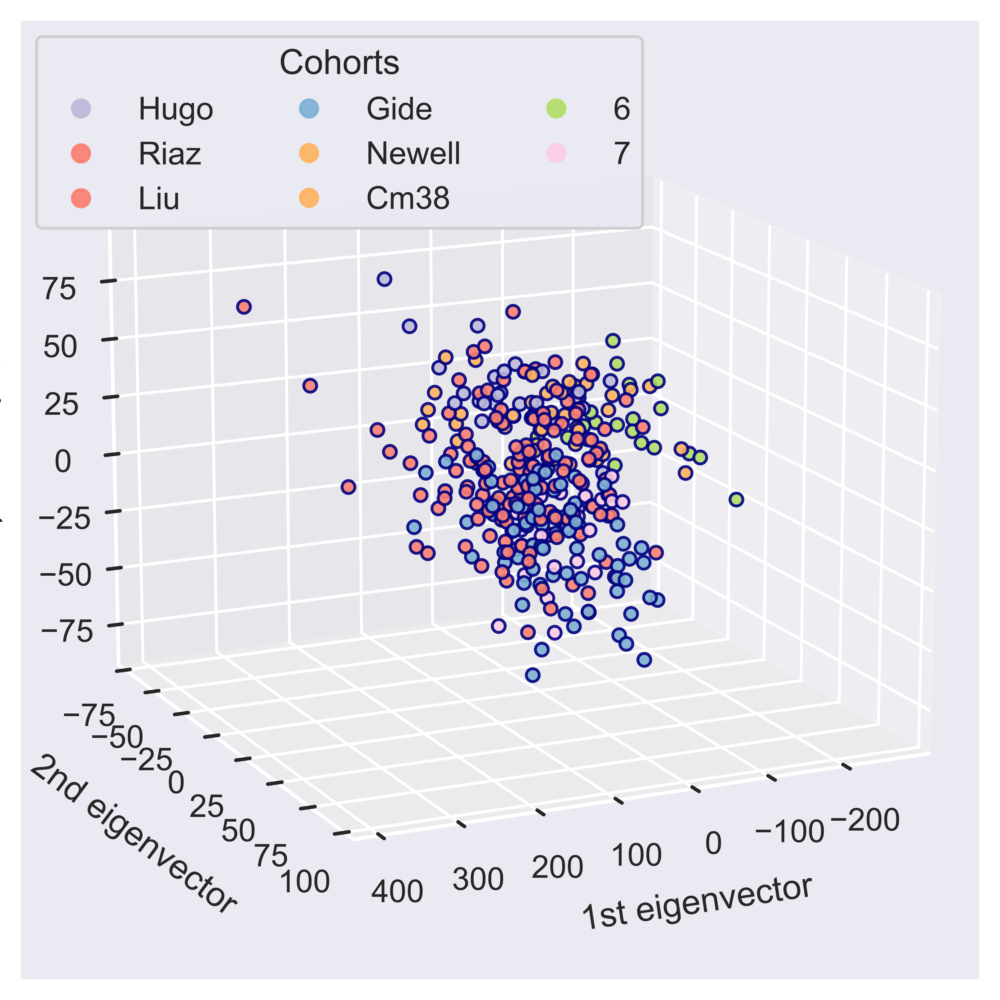

In [136]:
#PCA in 3D
sns.set_style("darkgrid")

log2tpm_bc = np.log2(1.+tpm_bcDF)

X = log2tpm_bc
X = X.T
# X = X.iloc[:,hk_inds]

# Zero mean ...
# X = (X - np.mean(X,axis=0))

# ... or Z score
X = (X - np.mean(X,axis=0))/np.std(X,axis=0)

# plot the first three PCA dimensions
fig = plt.figure(1, figsize=(6, 6), dpi=1200)
ax = fig.add_subplot(111, projection="3d", elev=15, azim=65)

cmap = plt.get_cmap('Set3')
new_cmap = truncate_colormap(cmap, 0.2, 0.6)

n_pca_components = 10
pca = PCA(n_components=n_pca_components, svd_solver='full')
pca.fit(X)

X_reduced = np.dot(X, pca.components_.T)

loadings = pd.DataFrame(data=pca.components_.T * np.sqrt(pca.explained_variance_), 
    columns=[f'PC{i}' for i in range(1, X_reduced.shape[1] + 1)],
#     index=np.arange(len(hk_inds))
    index=np.arange(log2tpm_bc.shape[0])
)

print(loadings.head())

loadings_combatseq = loadings

loadings_pc1_combatseq = loadings['PC1'].values
loadings_pc2_combatseq = loadings['PC2'].values
loadings_pc3_combatseq = loadings['PC3'].values

print(log2tpm.iloc[np.argsort(loadings_pc1_combatseq)[::-1]].index[0:10])
print(log2tpm.iloc[np.argsort(loadings_pc2_combatseq)[::-1]].index[0:10])
print(log2tpm.iloc[np.argsort(loadings_pc3_combatseq)[::-1]].index[0:10])

scatter = ax.scatter(
    X_reduced[:, 0],
    X_reduced[:, 1],
    X_reduced[:, 2],
    c=batch_inds-1,
    cmap=new_cmap,
    edgecolor="Navy",
    s=20,
    alpha=0.9,
    label="Cohorts"
)

# ax.set_title("First three PCA directions: pyCombat-Seq")
ax.set_xlabel("1st eigenvector", labelpad=8)
# ax.xaxis.set_ticklabels([])
ax.set_ylabel("2nd eigenvector", labelpad=8)
# ax.yaxis.set_ticklabels([])
ax.set_zlabel("3rd eigenvector", labelpad=8)
# ax.zaxis.set_ticklabels([])

# *scatter.legend_elements()
legend1 = ax.legend(*scatter.legend_elements(),ncol=3,
                    loc="upper left", title="Cohorts")
legend1.get_texts()[0].set_text(cohort_dict[0])
legend1.get_texts()[1].set_text(cohort_dict[1])
legend1.get_texts()[2].set_text(cohort_dict[2])
legend1.get_texts()[3].set_text(cohort_dict[3])
legend1.get_texts()[4].set_text(cohort_dict[4])
legend1.get_texts()[5].set_text(cohort_dict[5])
ax.add_artist(legend1)

# plt.savefig("pca_all_genes_ComBat-Seq.pdf", format='pdf')

plt.show()

(337, 2)


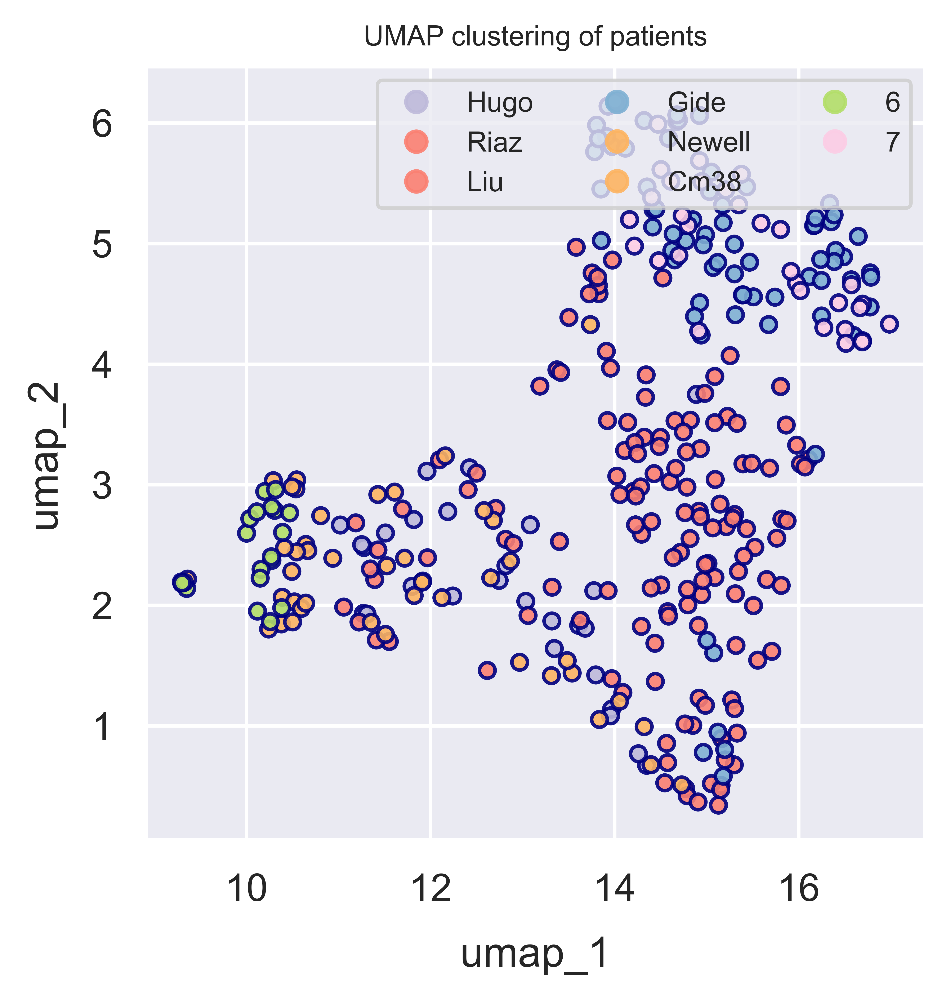

In [137]:
X = log2tpm_bc.T.values  

# plot the first three PCA dimensions
plt.figure(1, figsize=(4,4), dpi=1200)


cmap = plt.get_cmap('Set3')
new_cmap = truncate_colormap(cmap, 0.2, 0.6)

ss = StandardScaler()
X = ss.fit_transform(X)

umap_embedding = UMAP().fit_transform(X)
print(umap_embedding.shape)

# plt.scatter(embedding[:, 0], embedding[:, 1], c=irs.T.values/4., cmap='coolwarm')
plt.scatter(umap_embedding[:, 0], umap_embedding[:, 1],c=batch_inds-1,
    cmap=new_cmap,
    edgecolor="Navy",
    s=20,
    alpha=0.9,
    label="Cohorts")


plt.title('UMAP clustering of patients', fontsize=8)
plt.xlabel("umap_1",labelpad=8)
# ax.xaxis.set_ticklabels([])
plt.ylabel("umap_2",labelpad=8)
# ax.yaxis.set_ticklabels([])


# create a custom legend using the dictionary
legend1 = plt.legend(*scatter.legend_elements(),ncol=3,
                    loc="upper right", fontsize=8)
legend1.get_texts()[0].set_text(cohort_dict[0])
legend1.get_texts()[1].set_text(cohort_dict[1])
legend1.get_texts()[2].set_text(cohort_dict[2])
legend1.get_texts()[3].set_text(cohort_dict[3])
legend1.get_texts()[4].set_text(cohort_dict[4])
legend1.get_texts()[5].set_text(cohort_dict[5])

plt.show()

### Let's compute the matrix of direction cosine matrix of the loadings of the first PCs in the two methods

In [138]:
from sklearn.metrics.pairwise import cosine_similarity

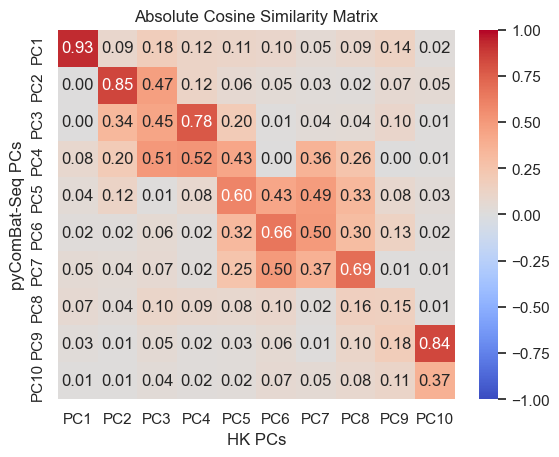

In [139]:
cos_sim_mat =cosine_similarity(loadings_hk.T, loadings_combatseq.T)

# create a heatmap using seaborn
sns.set(font_scale=1)
sns.set_style("whitegrid")
ax = sns.heatmap(np.abs(cos_sim_mat),
                 vmin=-1,
                 vmax=1,
                 cmap="coolwarm",
                 annot=True,
                 fmt=".2f",
                 xticklabels=[f"PC{i+1}" for i in range(10)],
                 yticklabels=[f"PC{i+1}" for i in range(10)])
plt.title("Absolute Cosine Similarity Matrix")
plt.xlabel("HK PCs")
plt.ylabel("pyComBat-Seq PCs")
plt.show()

### Save iRECIST

In [140]:
# combinediR = np.append(np.append(np.append(np.append(np.append(np.append(np.append(np.append(np.append(hugo_ir,riaz_ir),liu_ir),gide_pd1_ir)
#                                                                          ,gide_ipipd1_ir),newell_ir),du_ir), cm38_ir), cm64_ir), cm67_ir)

combinediR =np.append(np.append(np.append(np.append(np.append(np.append(np.append(np.append(hugo_ir,riaz_ir),liu_ir),gide_pd1_ir)
                                                                         ,gide_ipipd1_ir),newell_ir), cm38_ir), cm64_ir), cm67_ir)

combinediR_df = pd.DataFrame(combinediR, index=combinedTPM_df.keys().values, columns=['iRECIST'])
combinediR_df.to_csv('./../Data/Preprocessing_TPM_data/combinedIR_df.csv')

In [141]:
# Set 'Mixed response' MR=SD. The score for 'inevaluable', NE, is set to 0. 
# (According to https://doi.org/10.1245/s10434-020-08663-8, 64% of MR patients could be considered SD)
iRECIST_dict = {'np.nan':0, np.nan:0, 'NE':0,'PD':1,'SD':2, 'MR':2,'PR':3,'CR':4}

combinediR_score_df = pd.DataFrame([iRECIST_dict[combinediR_df.iloc[k,0]] for k in np.arange(len(combinediR_df))], index =combinediR_df.index, columns=['iR_score'])
combinediR_score_df.to_csv('./../Data/Preprocessing_TPM_data/combinedIR_score_df.csv')

In [142]:
len(combinediR_score_df['iR_score'].values)

337

### Save OS and Days

In [143]:
# Currently no OS or Days information for Newell or Du. Set them to np.nan. 
# THESE ARE IN "Cohort data for methylation analysis/Newell clinical data.xlsx"!
newell_dead = np.nan*np.ones(newellDF.shape[1])
newell_days = np.nan*np.ones(newellDF.shape[1])
# du_dead = np.nan*np.ones(duDF.shape[1])
# du_days = np.nan*np.ones(duDF.shape[1])

cm38_dead = np.nan*np.ones(cm38DF.shape[1])
cm64_dead = np.nan*np.ones(cm64DF.shape[1])
cm67_dead = np.nan*np.ones(cm67DF.shape[1])

# combinedOS: alive=0, dead=1
# combinedOS = np.append(np.append(np.append(np.append(np.append(np.append(np.append(np.append(np.append(hugo_dead,riaz_dead),liu_dead),
#                                                      gide_pd1_dead),gide_ipipd1_dead),newell_dead),du_dead),cm38_dead),cm64_dead),cm67_dead)

combinedOS = np.append(np.append(np.append(np.append(np.append(np.append(np.append(np.append(hugo_dead,riaz_dead),liu_dead),
                                                     gide_pd1_dead),gide_ipipd1_dead),newell_dead),cm38_dead),cm64_dead),cm67_dead)

combinedOS_df = pd.DataFrame(combinedOS, index=combinedTPM_df.keys().values, columns=['OS'])
combinedOS_df.to_csv('./../Data/Preprocessing_TPM_data/combinedOS_df.csv')

# combinedDays = np.append(np.append(np.append(np.append(np.append(np.append(np.append(np.append(np.append(hugo_days,riaz_days),liu_days),
#                                                        gide_pd1_days),gide_ipipd1_days),newell_days),du_days),cm38_os_days),cm64_os_days),cm67_os_days)

combinedDays =np.append(np.append(np.append(np.append(np.append(np.append(np.append(np.append(hugo_days,riaz_days),liu_days),
                                                       gide_pd1_days),gide_ipipd1_days),newell_days), cm38_os_days),cm64_os_days),cm67_os_days)


combinedDays_df = pd.DataFrame(combinedDays, index=combinedTPM_df.keys().values, columns=['Days'])
combinedDays_df.to_csv('./../Data/Preprocessing_TPM_data/combinedDays_df.csv')

In [144]:
combinedOS_df.to_csv('./../Data/Preprocessing_TPM_data/combinedOS_df.csv')
combinedDays_df.to_csv('./../Data/Preprocessing_TPM_data/combinedDays_df.csv')

### Save TMB

In [146]:
# HUGO cohort
hugo_tmb = {'Patient ID':['Pt1','Pt2','Pt3','Pt4','Pt5','Pt6','Pt7','Pt8','Pt9','Pt10','Pt11','Pt12','Pt13',
                        'Pt14','Pt15','Pt16','Pt17','Pt18','Pt19','Pt20','Pt21','Pt22','Pt23','Pt24','Pt25',
                        'Pt26','Pt27A','Pt28','Pt29','Pt30','Pt31','Pt32','Pt33','Pt34','Pt35','Pt36','Pt37',
                        'Pt38'],'TotalNonSyn':[1645,1943,1146,3985,316,238,1217,807,495,232,253,104,460,
1465,523,526,849,312,655,577,239,73,281,443,139,1124,2297,483,244,565,621,261,668,90,313,73,557,81], 
'PctCov15':[95.5, 97.5, 96.6, 96., 95.8, 95.3, 97.2, 96.8, 97.2, 96.2, 94., 97.3, 95.2, 97.1, 97., 97.9, 93.6, 
     96., 95.4, 97.2, 97.1, 95.8, 96.9, 96.8, 96.6, 96.4, 98.3, 97.5, 97.5, 97.4, 97.4, 97.3, 97.7, 97.4, 
     97.8, 97., 97.6, 97.3] }
hugo_tmb_df = pd.DataFrame(data=hugo_tmb)

In [147]:
hugo_tmb_new = np.zeros(len(hugo_pt), dtype=float)

for ind in np.arange(len(hugo_pt)):
    
    ptInd = np.where(hugo_tmb_df['Patient ID'] == hugo_pt[ind])[0][0]
    hugo_tmb_new[ind] = hugo_tmb_df.iloc[ptInd,1]

In [148]:
#Riaz report mutational load instead of Total Nonsynonymous mutations (are they equal?). 
#Key 'TotalNonSyn' used for consistency
riaz_tmb = {'Patient ID':["Pt1", "Pt10", "Pt100", "Pt101", "Pt102", "Pt103", "Pt104", "Pt106", "Pt108", 
                        "Pt11", "Pt13", "Pt17", "Pt18", "Pt2", "Pt23", "Pt24",
                        "Pt25", "Pt26", "Pt27", "Pt28", "Pt29", "Pt3", "Pt30", "Pt31", "Pt32", "Pt34", 
                        "Pt36", "Pt37", "Pt38", "Pt39", "Pt4", "Pt44", "Pt46", "Pt47", "Pt48", "Pt49", 
                        "Pt5", "Pt51", "Pt52", "Pt53", "Pt54", "Pt58", "Pt59", "Pt60", "Pt62", "Pt65", 
                        "Pt66", "Pt67", "Pt68", "Pt7", "Pt70", "Pt71", "Pt72", "Pt73", "Pt74", "Pt76", 
                        "Pt77", "Pt78", "Pt79", "Pt8", "Pt82", "Pt83", "Pt84", "Pt85", "Pt86", "Pt87", 
                        "Pt89", "Pt9", "Pt90", "Pt92", "Pt93", "Pt94", "Pt98"],'TotalNonSyn':[np.nan,75,6,10,
393,21,5,700,19,106,171,20,217,np.nan,646,1,96,125,183,42,412,182,66,450,112,212,2,29,449,np.nan,285,365,180,1005,99,852,
52,204,353,81,7360,862,432,829,np.nan,2619,153,16,1012,1517,428,5,437,14,44,224,49,np.nan,544,87,33,
339,11,129,562,677,214,409,283,642,7,405,20]}

riaz_tmb_df = pd.DataFrame(data=riaz_tmb)

In [149]:
riaz_tmb_new = np.zeros(len(riaz_pt), dtype=float)

for ind in np.arange(len(riaz_pt)):
    
    ptInd = np.where(riaz_tmb_df['Patient ID'] == riaz_pt[ind])[0][0]
    riaz_tmb_new[ind] = riaz_tmb_df.iloc[ptInd,1]

In [150]:
#Liu cohort
liu_tmb = {'Patient ID':['Patient1','Patient10','Patient100','Patient102','Patient104',
'Patient105','Patient106','Patient107','Patient108',
'Patient11','Patient110','Patient112','Patient116',
'Patient117','Patient118','Patient119','Patient120',
'Patient121','Patient125','Patient126','Patient127',
'Patient13','Patient130','Patient131','Patient132',
'Patient133','Patient134','Patient135','Patient136',
'Patient137','Patient14','Patient140','Patient141',
'Patient142','Patient143','Patient144','Patient145',
'Patient146','Patient147','Patient148','Patient149',
'Patient15','Patient150','Patient154','Patient155',
'Patient156','Patient157','Patient158','Patient159',
'Patient162','Patient163','Patient165','Patient166',
'Patient167','Patient168','Patient169','Patient17',
'Patient170','Patient172','Patient173','Patient179',
'Patient18','Patient180','Patient181','Patient182',
'Patient183','Patient184','Patient185','Patient187',
'Patient188','Patient189','Patient191','Patient192',
'Patient193','Patient195','Patient196','Patient197',
'Patient20','Patient200','Patient201','Patient203',
'Patient204','Patient205','Patient206','Patient21',
'Patient22','Patient23','Patient24','Patient25',
'Patient27','Patient30','Patient31','Patient32',
'Patient33','Patient34','Patient35','Patient36',
'Patient37','Patient38','Patient39','Patient4',
'Patient40','Patient41','Patient42','Patient43',
'Patient44','Patient45','Patient46','Patient47',
'Patient48','Patient49','Patient50','Patient51',
'Patient54','Patient55','Patient56','Patient58',
'Patient59','Patient6','Patient60','Patient61',
'Patient62','Patient63','Patient67','Patient7',
'Patient72','Patient73','Patient75','Patient77',
'Patient78','Patient79','Patient8','Patient80',
'Patient82','Patient83','Patient84','Patient86',
'Patient87','Patient88','Patient9','Patient94',
'Patient96','Patient98','Patient99']
,'TotalNonSyn':[22,71,126,246,96,125,245,158,45,172,1007,241,230,34,221,80,1090,
767,57,656,414,593,281,311,630,341,328,388,577,860,30,2077,60,48,334,824,288,
375,542,320,219,182,23,72,255,202,443,2296,46,1566,201,641,10,42,31,1382,365,
56,678,72,478,342,583,275,173,327,1983,157,133,22,50,4234,461,
571,1963,1734,59,394,735,58,72,1772,572,5426,105,58,132,276,328,217,
158,167,270,10,18,40,180,40,39,11,384,6103,9835,507,84,64,
293,833,756,29,1624,195,1134,288,478,17,91,315,935,392,2117,6249,
84,74,79,121,90,725,92,43,205,194,33,1477,194,47,279,87,37,652,268,649,
302,909]}

liu_tmb_df = pd.DataFrame(data=liu_tmb) 

In [151]:
liu_tmb_new = np.zeros(len(liu_pt), dtype=float)

for ind in np.arange(len(liu_pt)):
    
    ptInd = np.where(liu_tmb_df['Patient ID'] == liu_pt[ind])[0][0]
    liu_tmb_new[ind] = liu_tmb_df.iloc[ptInd,1]

In [152]:
gide_pd1_tmb_new = np.nan*np.ones(len(gide_pd1_pt))
gide_ipipd1_tmb_new = np.nan*np.ones(len(gide_ipipd1_pt))
newell_tmb_new = np.nan*np.ones(len(np.setdiff1d(newell_pt,newell_gide_overlap_mela)))
# du_tmb= np.nan*np.ones(duDF.shape[1])
cm38_tmb= np.nan*np.ones(cm38DF.shape[1])
cm64_tmb= np.nan*np.ones(cm64DF.shape[1])
cm67_tmb= np.nan*np.ones(cm67DF.shape[1])

In [153]:
# combinedTMB = np.append(np.append(np.append(np.append(np.append(np.append(np.append(np.append(np.append(hugo_tmb_new,riaz_tmb_new),liu_tmb_new),gide_pd1_tmb_new),
#                                             gide_ipipd1_tmb_new),newell_tmb_new),du_tmb),cm38_tmb),cm64_tmb),cm67_tmb)

combinedTMB = np.append(np.append(np.append(np.append(np.append(np.append(np.append(np.append(hugo_tmb_new,riaz_tmb_new),liu_tmb_new),gide_pd1_tmb_new),
                                            gide_ipipd1_tmb_new),newell_tmb_new),cm38_tmb),cm64_tmb),cm67_tmb)

combinedTMB_df = pd.DataFrame(combinedTMB, index=combinedTPM_df.keys().values, columns=['TMB'])
combinedTMB_df.to_csv('./../Data/Preprocessing_TPM_data/combinedTMB.csv')

In [154]:
### Make batch correction to TMB:
# TMB is at least 1 for each patient, so we can take log directly

logTMB_df = np.log(combinedTMB_df)
logTMB_bc = logTMB_df.copy()

for batch in np.unique(batch_inds):

    inds = np.where(batch_inds==batch)
    logTMB_bc.iloc[inds] = (logTMB_df.iloc[inds] - np.mean(logTMB_df.iloc[inds]))/np.std(logTMB_df.iloc[inds], axis=0)


In [155]:
logTMB_bc.to_csv('./../Data/Preprocessing_TPM_data/combined_logTMB_bc.csv')

In [156]:
logTMB_bc

,TMB
HUGO.0,1.274706
HUGO.1,1.444076
HUGO.2,2.174795
HUGO.3,-0.403560
HUGO.4,-0.691931
...,...
CM67.26,NaN
CM67.27,NaN
CM67.28,NaN
CM67.29,NaN


### Save methylation data

In [157]:
newell_meth_all_df = pd.read_csv('./../Data/Preprocessing_TPM_data/Newell_GeneMethyl_Median_AllSamples.csv', sep='\t', low_memory=False, index_col=0)

In [158]:
newell_pt

Index(['MELA_0228', 'MELA_0357', 'MELA_0359', 'MELA_0365', 'MELA_0367',
       'MELA_0369', 'MELA_0379', 'MELA_0380', 'MELA_0382', 'MELA_0386',
       'MELA_0391', 'MELA_0398', 'MELA_0418', 'MELA_0421', 'MELA_0425',
       'MELA_0433', 'MELA_0436', 'MELA_0441', 'MELA_0444', 'MELA_0445',
       'MELA_0446', 'MELA_0447', 'MELA_0472', 'MELA_0552', 'MELA_0562',
       'MELA_0608'],
      dtype='object')

In [159]:
newell_meth_all_df.keys()

Index(['MELA_0228', 'MELA_0255', 'MELA_0357', 'MELA_0359', 'MELA_0360',
       'MELA_0361', 'MELA_0364', 'MELA_0365', 'MELA_0367', 'MELA_0368',
       'MELA_0369', 'MELA_0370', 'MELA_0374', 'MELA_0376', 'MELA_0377',
       'MELA_0378', 'MELA_0379', 'MELA_0380', 'MELA_0381', 'MELA_0382',
       'MELA_0384', 'MELA_0385', 'MELA_0386', 'MELA_0387', 'MELA_0388',
       'MELA_0391', 'MELA_0392', 'MELA_0393', 'MELA_0395', 'MELA_0398',
       'MELA_0407', 'MELA_0413', 'MELA_0418', 'MELA_0421', 'MELA_0425',
       'MELA_0430', 'MELA_0433', 'MELA_0434', 'MELA_0436', 'MELA_0444',
       'MELA_0447', 'MELA_0458', 'MELA_0562'],
      dtype='object')

In [160]:
# 20 patients in Newell (not in Gide) have mean beta per gene, expression data, and iRECIST score
np.intersect1d(newell_pt,newell_meth_all_df.keys())

array(['MELA_0228', 'MELA_0357', 'MELA_0359', 'MELA_0365', 'MELA_0367',
       'MELA_0369', 'MELA_0379', 'MELA_0380', 'MELA_0382', 'MELA_0386',
       'MELA_0391', 'MELA_0398', 'MELA_0418', 'MELA_0421', 'MELA_0425',
       'MELA_0433', 'MELA_0436', 'MELA_0444', 'MELA_0447', 'MELA_0562'],
      dtype=object)

In [161]:
newell_meth = np.intersect1d(newell_pt,newell_meth_all_df.keys())

In [162]:
len(newell_meth)

20

In [163]:
newell_meth_new = np.array([])

for pt in newell_meth:

    newell_meth_new = np.append(newell_meth_new,pt_keyDF.iloc[0,np.where(pt_keyDF.iloc[1,:]== pt)[0]])

In [164]:
methDF = pd.DataFrame(columns = tpmDF.keys())

for pt in np.arange(len(newell_meth_new)):
    
    methDF[newell_meth_new[pt]] = newell_meth_all_df[newell_meth[pt]]

In [165]:
len(np.intersect1d(tpm_bcDF.index.values,methDF.index.values))

15380

In [168]:
methDF.to_csv('./../Data/Preprocessing_TPM_data/methDF.csv')

## Methylation and Days: All Newell patients

In [169]:
#From file 'Newell clinical data.xlxs' 

# Data hidden

newell_pt_all = np.array([])

newell_pfs_months_all =np.array([])

newell_progressed_all =np.array([])

newell_OS_months_all =np.array([])


newell_days_all = 30.5*newell_OS_months_all

In [170]:
newell_meth_all_df = pd.read_csv('./../Data/Preprocessing_TPM_data/Newell_GeneMethyl_Median_AllSamples.csv', sep='\t', low_memory=False, index_col=0)